# Intencion de Compra

## Imports

In [3]:
import pandas as pd
import numpy as np
import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency


## Functions

In [18]:
def outliers(df,x):
    q1 = np.percentile(df[x], 25)
    q3 = np.percentile(df[x], 75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    outliers = [x for x in df[x] if x < lower_bound or x > upper_bound]
    return outliers

def df_without_outliers(df,x,lower_bound,upper_bound):
    # q1 = np.percentile(df[x], 25)
    # q3 = np.percentile(df[x], 75)
    # iqr = q3 - q1
    # lower_bound = q1 - 1.5 * iqr
    # upper_bound = q3 + 1.5 * iqr
    
    wo_outliers = df[(df[x]>=np.quantile(df[x],lower_bound)) & (df[x]<=np.quantile(df[x],upper_bound))]
    return wo_outliers

## Exploratory Data Analysis

#### Data

In [5]:
# Dataframe head and shape

df=pd.read_csv('online_shoppers_intention.csv')
print('The dataframe has ',df.shape[0],' rows and ',df.shape[1],' columns')
print(df.info())
df.head()

The dataframe has  12330  rows and  18  columns
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   123

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


Administrative:
This is the number of pages of this type (administrative) that the user visited.

Administrative_Duration:
This is the amount of time spent in this category of pages.

Informational:
This is the number of pages of this type (informational) that the user visited.

Informational_Duration:
This is the amount of time spent in this category of pages.

ProductRelated:
This is the number of pages of this type (product related) that the user visited.

ProductRelated_Duration:
This is the amount of time spent in this category of pages.

BounceRates:
The percentage of visitors who enter the website through that page and exit without triggering any additional tasks.

ExitRates:
The percentage of pageviews on the website that end at that specific page.

PageValues:
The average value of the page averaged over the value of the target page and/or the completion of an eCommerce transaction.

SpecialDay:
This value represents the closeness of the browsing date to special days or holidays (eg Mother's Day or Valentine's day) in which the transaction is more likely to be finalized.

Month:
Contains the month the pageview occurred, in string form.

OperatingSystems:
An integer value representing the operating system that the user was on when viewing the page.

Browser:
An integer value representing the browser that the user was using to view the page.

Region:
An integer value representing which region the user is located in.

TrafficType:
An integer value representing what type of traffic the user is categorized into.

VisitorType:
A string representing whether a visitor is New Visitor, Returning Visitor, or Other.

Weekend:
A boolean representing whether the session is on a weekend.

Revenue:
A boolean representing whether or not the user completed the purchase.

In [4]:
df.isna().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [5]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


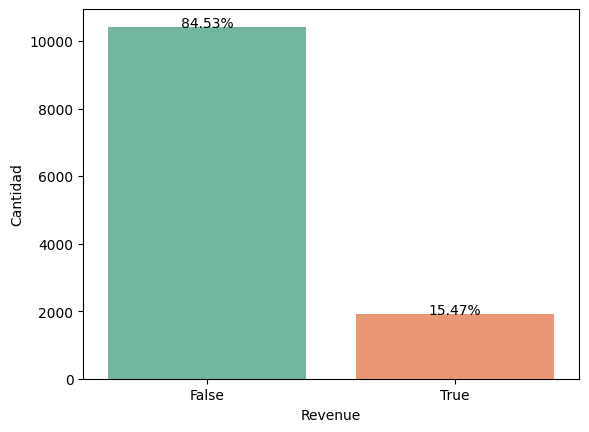

In [6]:
# Variable objetivo
df_grouped = df.groupby('Revenue')['Administrative'].count().reset_index().rename(columns={'Administrative':'Cantidad'})

# Calcular el porcentaje de cada grupo
df_grouped['Porcentaje'] = (df_grouped['Cantidad'] / df_grouped['Cantidad'].sum()) * 100

# Crear el gráfico de barras
barplot = sns.barplot(x='Revenue', y='Cantidad', data=df_grouped, palette='Set2')

# Añadir anotaciones de porcentaje en el gráfico
for index, row in df_grouped.iterrows():
    barplot.text(index, row.Cantidad, f"{row.Porcentaje:.2f}%", color='black', ha="center")

plt.show()

### Feature Engineering

In [8]:
# Creamos listas con variables discretas y continuas para hacer distintos graficos.

categorical_vars = ['Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType', 'Weekend', 'Revenue']

continuous_vars = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']

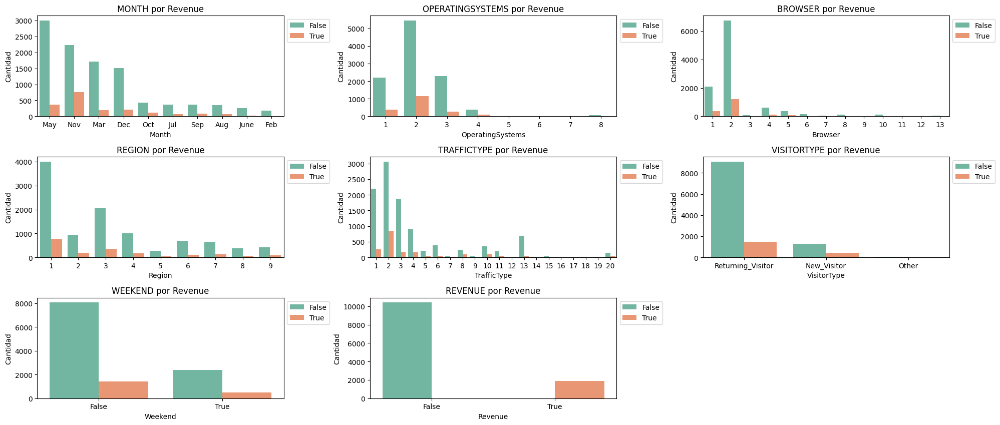

In [10]:
# Distribución de las variables discretas
num_plots = len(categorical_vars)  
num_rows = 5
num_cols = 3  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))

for i, var in enumerate(categorical_vars):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col] 

    #print(df[var].describe(), "\n")  # Descripción de la variable
    df_cat=df.groupby('Revenue')[var].value_counts().reset_index(name='Cantidad')
    sns.barplot(x=var, y="Cantidad", hue="Revenue", data=df_cat,ax=ax,palette='Set2')

    ax.set_title(f"{var.upper()} por Revenue")  
    ax.set_xlabel(var)  
    ax.set_ylabel('Cantidad') 
    ax.set_ylim(bottom=0)  
    ax.legend( loc='upper right', bbox_to_anchor=(1.2, 1))  

for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  
plt.show()


### Variables Continuas

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWar

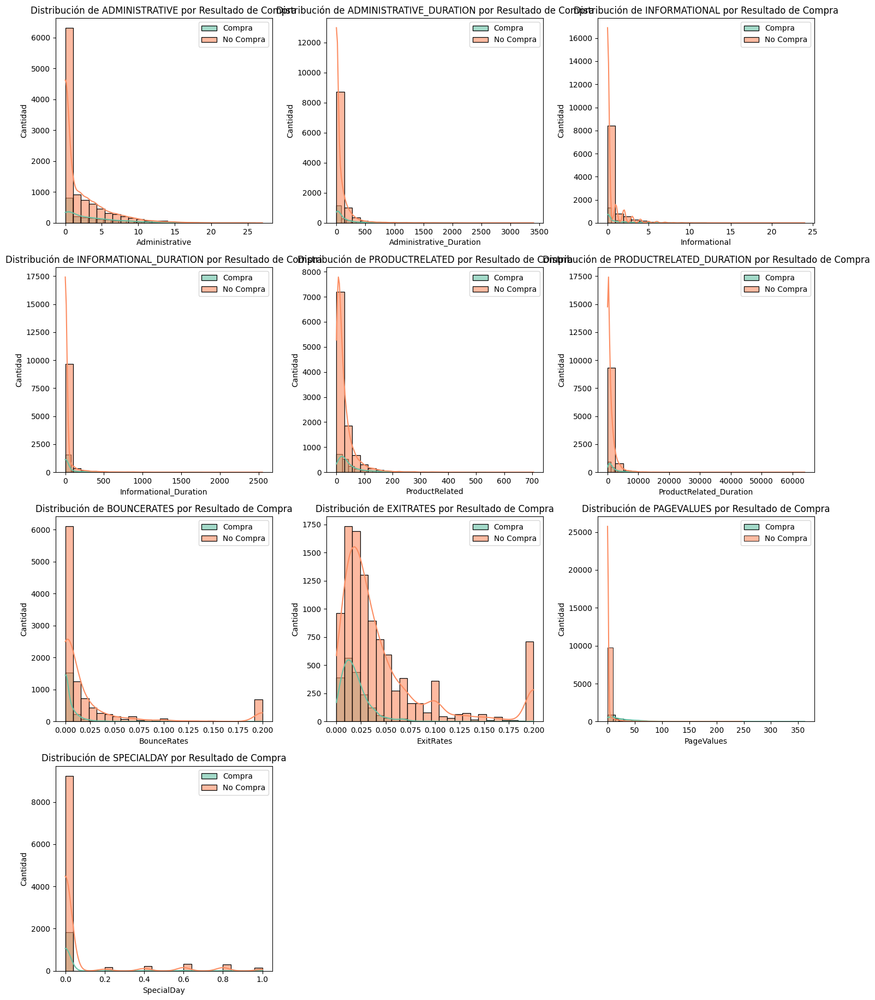

In [11]:
num_variables = len(continuous_vars)
num_cols = 3  
num_rows = (num_variables - 1) // num_cols + 1  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*5))  

# Obtener colores de la paleta 'Set2'
palette_colors = sns.color_palette('Set2')

for i, var in enumerate(continuous_vars):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col] if num_rows > 1 else axes[col] 
    
    # Usar colores específicos de la paleta 'Set2' para compras y no compras
    sns.histplot(data=df[df.Revenue==1], x=var, color=palette_colors[0], kde=True, bins=25, ax=ax, alpha=0.6, label='Compra')
    sns.histplot(data=df[df.Revenue==0], x=var, color=palette_colors[1], kde=True, bins=25, ax=ax, alpha=0.6, label='No Compra')
    
    ax.set_title(f"Distribución de {var.upper()} por Resultado de Compra") 
    ax.set_ylabel("Cantidad") 
    ax.legend()

# Eliminar los ejes vacíos si el número de variables no llena la última fila
for i in range(num_variables, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Outliers

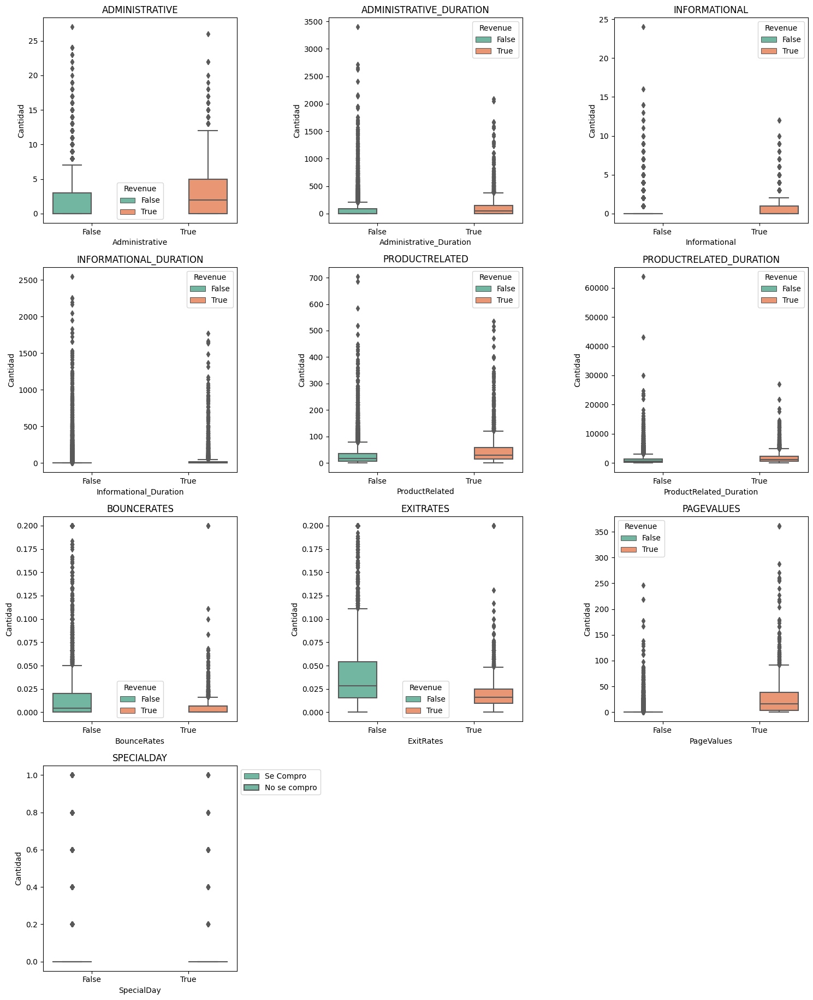

In [12]:
num_variables = len(continuous_vars)
num_cols = 3  
num_rows = (num_variables - 1) // num_cols + 1  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*5))  
palette_colors = sns.color_palette('Set2')
for i, var in enumerate(continuous_vars):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col] if num_rows > 1 else axes[col] 
    
    sns.boxplot(y=var,x='Revenue', hue="Revenue", data=df[[var,'Revenue']], palette="Set2", ax=ax)
    
    ax.set_title(var.upper()) 
    ax.set_ylabel("Cantidad") 
    ax.set_xlabel(var) 

for i in range(num_variables, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.legend(["Se Compro", "No se compro"], bbox_to_anchor=(1, 1), loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [14]:
print('Porcentaje de outliers por variable:\n')
for var in continuous_vars:
    #df[var][df[var]%5!=0]=df[var][df[var]%5!=0].apply(lambda x:round(x/5)*5)
    print('-----------\n',var.upper(),'\n-----------')
    perc=len(outliers(df,var))/df.shape[0]
    print("Porcentaje de outliers: ",round(perc,2),'%\n')

Porcentaje de outliers por variable:

-----------
 ADMINISTRATIVE 
-----------
Porcentaje de outliers:  0.03 %

-----------
 ADMINISTRATIVE_DURATION 
-----------
Porcentaje de outliers:  0.1 %

-----------
 INFORMATIONAL 
-----------
Porcentaje de outliers:  0.21 %

-----------
 INFORMATIONAL_DURATION 
-----------
Porcentaje de outliers:  0.2 %

-----------
 PRODUCTRELATED 
-----------
Porcentaje de outliers:  0.08 %

-----------
 PRODUCTRELATED_DURATION 
-----------
Porcentaje de outliers:  0.08 %

-----------
 BOUNCERATES 
-----------
Porcentaje de outliers:  0.13 %

-----------
 EXITRATES 
-----------
Porcentaje de outliers:  0.09 %

-----------
 PAGEVALUES 
-----------
Porcentaje de outliers:  0.22 %

-----------
 SPECIALDAY 
-----------
Porcentaje de outliers:  0.1 %



Debido a que los porcentajes son muy bajos, decidimos quedarnos con los outliers y analizar la distribucion de las variables sin ellos.

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWar

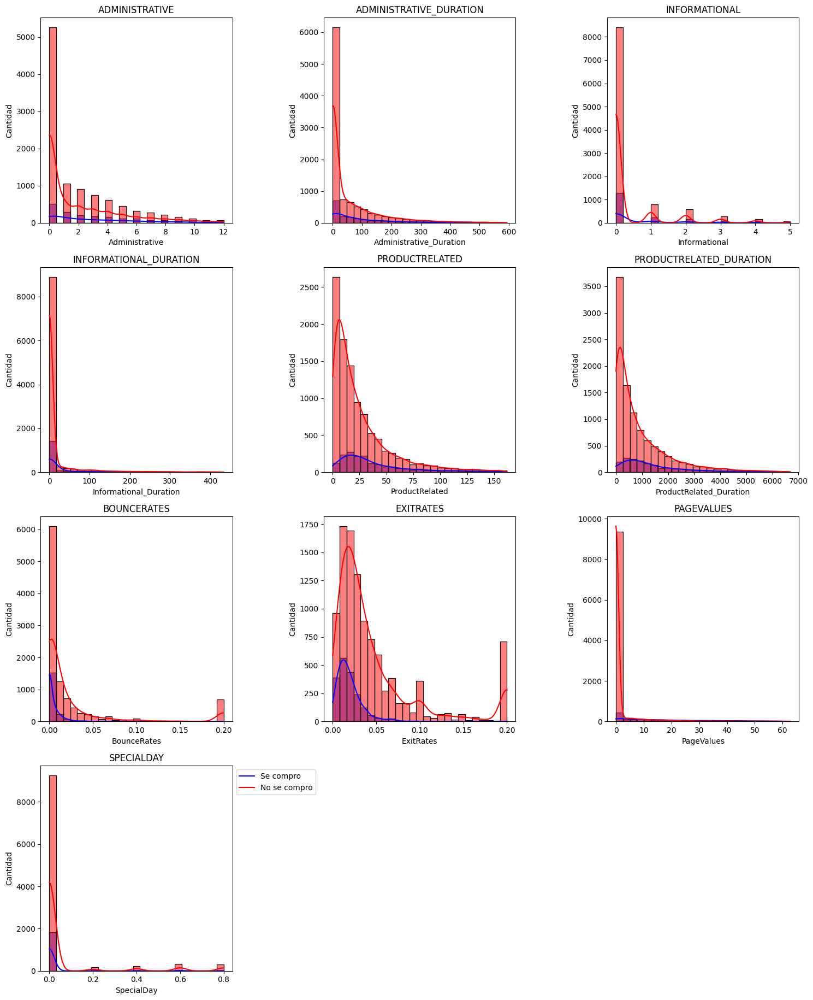

In [19]:
num_variables = len(continuous_vars)
num_cols = 3  
num_rows = (num_variables - 1) // num_cols + 1  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows*5))  

for i, var in enumerate(continuous_vars):
    row = i // num_cols
    col = i % num_cols
    
    ax = axes[row, col] if num_rows > 1 else axes[col] 
    
    df_out=df_without_outliers(df,var,0,0.98)
    sns.histplot(data=df_out[df_out.Revenue==1], x=var, color="blue", kde=True, bins=25, ax=ax)
    sns.histplot(data=df_out[df_out.Revenue==0], x=var, color="red", kde=True, bins=25, ax=ax)
    
    ax.set_title(var.upper()) 
    ax.set_ylabel("Cantidad") 

for i in range(num_variables, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.legend(["Se compro", "No se compro"], bbox_to_anchor=(1, 1), loc='upper left')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWar

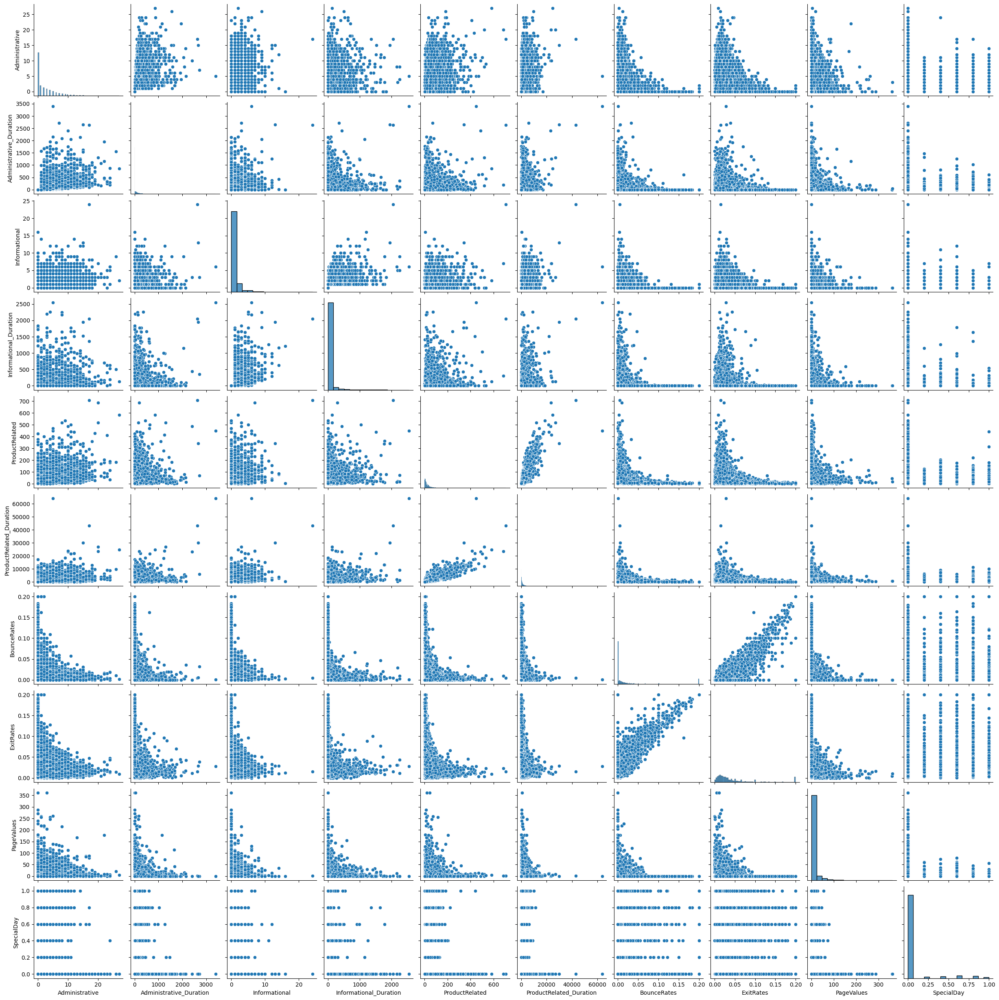

In [22]:


sns.pairplot(df[continuous_vars])
plt.show()

### Correlaciones

#### Correlaciones entre variables. 

In [24]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

In [17]:
categorical_vars

['Month',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType',
 'VisitorType',
 'Weekend',
 'Revenue']

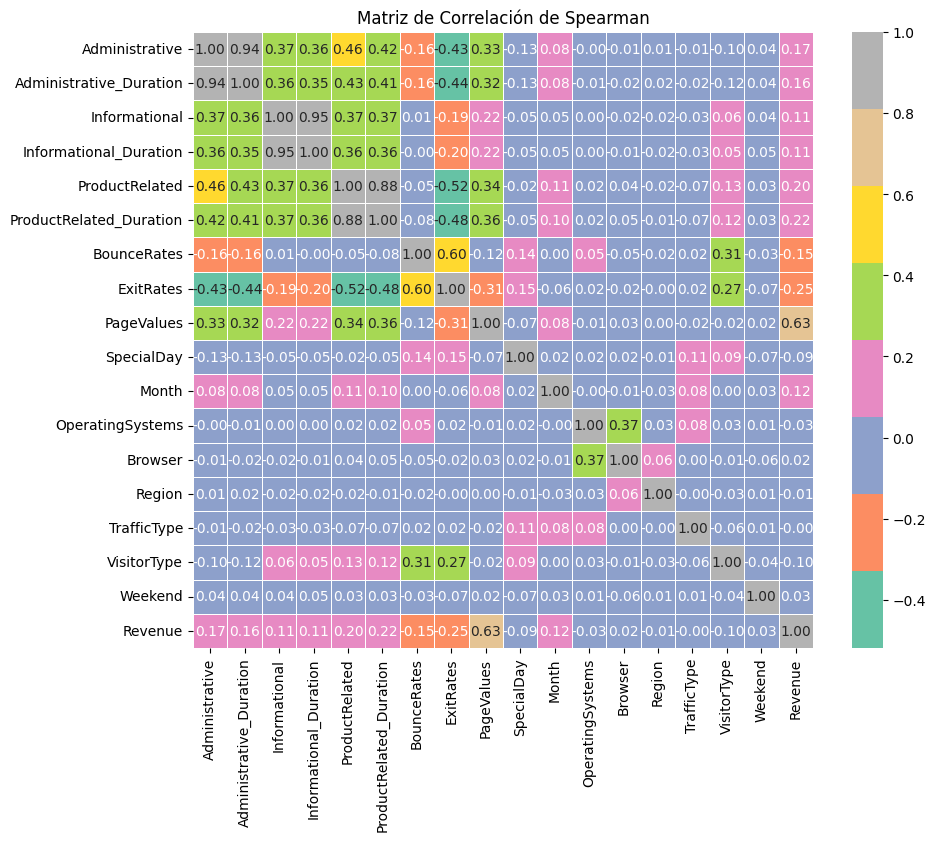

In [19]:
from sklearn.preprocessing import OrdinalEncoder

encoder = OrdinalEncoder()
 # Ajusta esto
df_encoded = df.copy()
df_encoded[categorical_vars] = encoder.fit_transform(df[categorical_vars])

# Para variables nominales, considera usar pd.get_dummies()

# Calcular la matriz de correlación de Spearman
corr_matrix = df_encoded.corr(method='spearman')

# Visualizar la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="Set2", linewidths=.5)
plt.title('Matriz de Correlación de Spearman')
plt.show()

## Model Development

#### Import Libraries

In [26]:
import pandas as pd
import numpy as np
from numpy import argmax
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score,precision_score,accuracy_score,recall_score,classification_report,confusion_matrix,precision_recall_curve,auc,roc_auc_score,roc_curve,average_precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split,cross_val_score, GridSearchCV, KFold, RandomizedSearchCV,RepeatedStratifiedKFold
from sklearn.preprocessing import OneHotEncoder,StandardScaler,MinMaxScaler,LabelEncoder,Normalizer,MaxAbsScaler,FunctionTransformer
from sklearn.decomposition import PCA
import random
#from imblearn.combine import SMOTEENN
from feature_engine.encoding import CountFrequencyEncoder,OrdinalEncoder
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import VotingClassifier
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostClassifier
import pickle
from datetime import date
import datetime
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import learning_curve
from sklearn.calibration import calibration_curve
from sklearn.preprocessing import PolynomialFeatures

import os
import joblib
import mlflow
from mlflow.models.signature import infer_signature


#### Functions

In [3]:
def print_metrics(y_val, y_pred):
  precision, recall, thresholds = precision_recall_curve(y_val, y_pred)
  pr_auc = auc(recall, precision)
  accuracy = accuracy_score(y_val, y_pred)
  precision=precision_score(y_val,y_pred)
  recall=recall_score(y_val,y_pred)
  f1=f1_score(y_val,y_pred)
  auc_score = roc_auc_score(y_val, y_pred)
  report = classification_report(y_val, y_pred)
  print(f"Accuracy: {accuracy}")
  print(f"Precision: {precision}")
  print(f"Recall: {recall}")
  print(f"F1-Score: {f1}")
  print(f"AUC-Score: {auc_score}")
  print(f"PRAUC: {pr_auc:.4f}")
#   print(f"Cross-Validation Accuracy: {cross_val_score(clf,X_val,y_val,cv=skf,scoring='accuracy').mean()}")
#   print(f"Classification Report:\n{report}")
#   return accuracy,precision,recall,f1,auc_score,pr_auc

def plot_confusion_matrix(y_true, y_pred):
  sns.heatmap(confusion_matrix(y_true, y_pred),
              annot=True,
              fmt='g',
              xticklabels=['0', '1'],
              yticklabels=['0', '1'])
  plt.ylabel('Actual', fontsize=13)
  plt.xlabel('Prediction', fontsize=13)
  plt.title('Confusion Matrix', fontsize=17)
  plt.show()
  plt.savefig('Visualizaciones/Confusion_matrix.png')

def plot_roc_curve(y_true, y_pred):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)

    plt.figure()
    plt.plot(fpr, tpr, label=f'ROC curve (area = {auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    plt.savefig('Visualizaciones/ROC_curve.png')

# def plot_learning_curve(model, X, y,skf):
#   train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=skf, scoring='accuracy', train_sizes=np.linspace(0.1, 1.0, 5))
  
#   train_scores_mean = np.mean(train_scores, axis=1)
#   train_scores_std = np.std(train_scores, axis=1)
#   test_scores_mean = np.mean(test_scores, axis=1)
#   test_scores_std = np.std(test_scores, axis=1)
  
#   plt.title("Learning Curve")
#   plt.xlabel("Training examples")
#   plt.ylabel("Score")
  
#   plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
#   plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
  
#   plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
#   plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")
  
#   plt.legend(loc="best")
#   plt.grid()
    
def plot_feature_importances(clf, X,style="seaborn", plot_size=(10, 8)):
  importances = clf.feature_importances_

  # Sort importances in descending order
  indices = np.argsort(importances)[::-1]

  feature_names = X.columns[indices]

  plt.figure(figsize=(12, 8))
  plt.title("Feature Importances")
  plt.bar(range(len(indices)), importances[indices], color="b", align="center")
  plt.xticks(range(len(indices)), feature_names, rotation=65)
  plt.xlabel("Feature")
  plt.ylabel("Importance")
  plt.tight_layout()
  plt.show()
  plt.savefig('Visualizaciones/Feature_importances.png')
  
  
def plot_learning_curve(
    estimator,
    title,
    X,
    y,
    axes=None,
    ylim=None,
    cv=None,
    n_jobs=None,
    scoring=None,
    train_sizes=np.linspace(0.1, 1.0, 5),
):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.

    Parameters
    ----------
    estimator : estimator instance
        An estimator instance implementing `fit` and `predict` methods which
        will be cloned for each validation.

    title : str
        Title for the chart.

    X : array-like of shape (n_samples, n_features)
        Training vector, where ``n_samples`` is the number of samples and
        ``n_features`` is the number of features.

    y : array-like of shape (n_samples) or (n_samples, n_features)
        Target relative to ``X`` for classification or regression;
        None for unsupervised learning.

    axes : array-like of shape (3,), default=None
        Axes to use for plotting the curves.

    ylim : tuple of shape (2,), default=None
        Defines minimum and maximum y-values plotted, e.g. (ymin, ymax).

    cv : int, cross-validation generator or an iterable, default=None
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:

          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, default=None
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    scoring : str or callable, default=None
        A str (see model evaluation documentation) or
        a scorer callable object / function with signature
        ``scorer(estimator, X, y)``.

    train_sizes : array-like of shape (n_ticks,)
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the ``dtype`` is float, it is regarded
        as a fraction of the maximum size of the training set (that is
        determined by the selected validation method), i.e. it has to be within
        (0, 1]. Otherwise it is interpreted as absolute sizes of the training
        sets. Note that for classification the number of samples usually have
        to be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator,
        X,
        y,
        scoring=scoring,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        return_times=True,
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    axes[0].fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    axes[0].plot(
        train_sizes, train_scores_mean, "o-", color="r", label="Training score"
    )
    axes[0].plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, "o-")
    axes[1].fill_between(
        train_sizes,
        fit_times_mean - fit_times_std,
        fit_times_mean + fit_times_std,
        alpha=0.1,
    )
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    fit_time_argsort = fit_times_mean.argsort()
    fit_time_sorted = fit_times_mean[fit_time_argsort]
    test_scores_mean_sorted = test_scores_mean[fit_time_argsort]
    test_scores_std_sorted = test_scores_std[fit_time_argsort]
    axes[2].grid()
    axes[2].plot(fit_time_sorted, test_scores_mean_sorted, "o-")
    axes[2].fill_between(
        fit_time_sorted,
        test_scores_mean_sorted - test_scores_std_sorted,
        test_scores_mean_sorted + test_scores_std_sorted,
        alpha=0.1,
    )
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")
    plt.savefig('Visualizaciones/Learning_curve.png')
    return plt
  
def plot_metrics(y_true,y_pred,clf,X_val,X_train,skf):
  plot_confusion_matrix(y_true,y_pred)
  plot_roc_curve(y_true,y_pred)
  plot_learning_curve(clf,X_val,y_true,skf)
  plot_feature_importances(clf,X_val)
  
def evaluate(df,model,y_true,y_pred,thr):
    df=df.copy()
    acc=accuracy_score(y_true,y_pred)
    pre=precision_score(y_true,y_pred)
    rec=recall_score(y_true,y_pred)
    f1=f1_score(y_true,y_pred)
    auc=roc_auc_score(y_true,y_pred)
    pr_auc=average_precision_score(y_true,y_pred)
    parametros=model.get_params()
    fecha=datetime.datetime.now()
    pkl_files = sorted(
        [f for f in os.listdir('Pipelines') if os.path.isfile(os.path.join('Pipelines', f)) and f.endswith('.pkl')],
        key=lambda x: int(x.split('_')[0])
    )
    eval={'Modelo':model,'Accuracy':acc,'Precision':pre,'Recall':rec,'F1':f1,'AUC':auc,'PRAUC':pr_auc,'Threshold':thr,'Parametros':parametros,'Fecha':fecha,'Pipelines':pkl_files}
    df=pd.concat([df,pd.DataFrame([eval])])
    df.to_csv('Metrics.csv',index=False)
    return df
    

#### Load Data

In [4]:

df=pd.read_csv('online_shoppers_intention.csv')
print('The dataframe has ',df.shape[0],' rows and ',df.shape[1],' columns')
print(df.info())
df.head()



The dataframe has  12330  rows and  18  columns
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   123

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


Administrative:
This is the number of pages of this type (administrative) that the user visited.

Administrative_Duration:
This is the amount of time spent in this category of pages.

Informational:
This is the number of pages of this type (informational) that the user visited.

Informational_Duration:
This is the amount of time spent in this category of pages.

ProductRelated:
This is the number of pages of this type (product related) that the user visited.

ProductRelated_Duration:
This is the amount of time spent in this category of pages.

BounceRates:
The percentage of visitors who enter the website through that page and exit without triggering any additional tasks.

ExitRates:
The percentage of pageviews on the website that end at that specific page.

PageValues:
The average value of the page averaged over the value of the target page and/or the completion of an eCommerce transaction.

SpecialDay:
This value represents the closeness of the browsing date to special days or holidays (eg Mother's Day or Valentine's day) in which the transaction is more likely to be finalized.

Month:
Contains the month the pageview occurred, in string form.

OperatingSystems:
An integer value representing the operating system that the user was on when viewing the page.

Browser:
An integer value representing the browser that the user was using to view the page.

Region:
An integer value representing which region the user is located in.

TrafficType:
An integer value representing what type of traffic the user is categorized into.

VisitorType:
A string representing whether a visitor is New Visitor, Returning Visitor, or Other.

Weekend:
A boolean representing whether the session is on a weekend.

Revenue:
A boolean representing whether or not the user completed the purchase.

#### Split X and Y

In [5]:
X=df.drop(['Revenue'],axis=1)
y=df['Revenue']

#### Train Test Split

In [6]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

### Pipelines

#### My Custom Pipeline

In [7]:
class CustomPipeline:
    def __init__(self, transformer):
        if not isinstance(transformer, (TransformerMixin, BaseEstimator)):
            raise ValueError("The provided object is not a valid transformer.")
        self.pipeline = transformer
    
    def fit(self, X, y=None):
        try:
            self.pipeline.fit(X, y)
            return self
        except AttributeError as e:
            raise AttributeError("The provided transformer does not have a fit method.") from e

    def transform(self, X):
        try:
            return self.pipeline.transform(X)
        except AttributeError as e:
            raise AttributeError("The provided transformer does not have a transform method.") from e

    def fit_transform(self, X, y=None):
        return self.fit(X, y).transform(X)
    
    @staticmethod
    def __count_pkl_files_in_folder(folder_path):
        files = os.listdir(folder_path)
        pkl_files = [f for f in files if os.path.isfile(os.path.join(folder_path, f)) and f.endswith('.pkl')]
        return len(pkl_files)
    
    @staticmethod
    def __load(folder_path, name):
        try:
            file = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f)) and f.endswith('.pkl') and f.split('_', 1)[1].replace('.pkl', '') == name][0]
            pipeline = joblib.load(os.path.join(folder_path, file))
            return pipeline
        except IndexError as e:
            raise IndexError(f"The provided file {name} does not exist.") from e
    
    def save(self, folder_path, name):
        try:
            if not os.path.exists(folder_path):
                os.makedirs(folder_path, exist_ok=True)
            
            # Verificar si existe un archivo con el mismo nombre (sin el prefijo numérico)
            existing_file = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f)) and f.endswith('.pkl') and f.split('_', 1)[1].replace('.pkl', '') == name]
            
            if existing_file:
                # Si existe, cargar y sobrescribir ese archivo
                pipeline = CustomPipeline.__load(folder_path, name )
                pipeline = self.pipeline
                print(f"Pipeline '{name}' cargado desde '{os.path.join(folder_path, existing_file[0])}'")
                joblib.dump(pipeline, os.path.join(folder_path, existing_file[0]))
                print(f"Se sobreescribio el Pipeline como '{os.path.join(folder_path,  existing_file[0])}'")
            else:
                # Si no existe, generar un nombre nuevo para el archivo
                number_of_files = CustomPipeline.__count_pkl_files_in_folder(folder_path)
                name = str(number_of_files + 1) + "_" + name + '.pkl'
            
            # Guardar el pipeline en un archivo .pkl dentro de la carpeta
                joblib.dump(self.pipeline, os.path.join(folder_path, name))
                print(f"Pipeline guardado como '{os.path.join(folder_path, name)}'")
            
        except Exception as e:
            print(f"Error al guardar el pipeline: {e}")
            raise e
        
        
def load_transformers(folder_path):
    pkl_files = sorted(
        [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f)) and f.endswith('.pkl')],
        key=lambda x: int(x.split('_')[0])
    )
    # Cargar los transformadores
    transformers = [joblib.load(os.path.join(folder_path, f)) for f in pkl_files]
    return transformers

#### Outlier Removal

In [8]:
class OutlierTransformation(BaseEstimator, TransformerMixin):
    def __init__(self, upper_bound=0.999,lower_bound=0.001):  
        self.columns=None
        self.upper_bound = upper_bound
        self.lower_bound = lower_bound
        
    def fit(self,X,y=None):
        self.columns=[x for x in X.columns if X[x].dtype=='int64' or X[x].dtype=='float64']
        return self

    def transform(self,X):
        if self.columns is None:
            raise RuntimeError("The fit method must be called before transform.")
        for col in self.columns:
            X.loc[(X[col]<=np.quantile(X[col],self.lower_bound)),col]=np.quantile(X[col],self.lower_bound)
            X.loc[(X[col]>=np.quantile(X[col],self.upper_bound)),col]=np.quantile(X[col],self.upper_bound)
        return X

In [10]:
ot=OutlierTransformation(upper_bound=0.98,lower_bound=0.01)
pipeline=CustomPipeline(ot)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','outlier_transformer')

Pipeline guardado como 'Pipelines\1_outlier_transformer.pkl'


#### NumericData

In [11]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [12]:
def feature_engineering(df):
    for i in ['Administrative', 'Informational', 'ProductRelated']:
        df[f'Total{i}'] = df[f'{i}'] * df[f'{i}_Duration']
    df['Total_Duration'] = df['Administrative_Duration'] + df['Informational_Duration'] + df['ProductRelated_Duration']
    df['PageValues/Total_Duration'] = df.apply(lambda x: x['PageValues'] / x['Total_Duration'] if x['Total_Duration']!=0 else 0,axis=1)
    df['PageValues_x_Total_Duration'] = df['PageValues'] * df['Total_Duration']
    df['Total_BounceExitRates'] = df['BounceRates'] + df['ExitRates']
    df['HigherThanAverage']=df.apply(lambda x: 1 if x.VisitorType=='New_Visitor' and x.Total_Duration>df[df.VisitorType=='New_Visitor']['Total_Duration'].mean() else
                                     1 if x.VisitorType!='New_Visitor' and x.Total_Duration>df[df.VisitorType!='New_Visitor']['Total_Duration'].mean() else
                                     0,axis=1)
    return df

In [13]:
NewVariables=FunctionTransformer(feature_engineering)
pipeline=CustomPipeline(NewVariables)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','new_variables')

Pipeline guardado como 'Pipelines\2_new_variables.pkl'


#### Log

In [14]:
def Log(df):
    for i in ['Administrative', 'Informational', 'ProductRelated', 'TotalAdministrative', 'TotalInformational', 'TotalProductRelated', 'Total_Duration', 'PageValues', 'PageValues/Total_Duration', 'PageValues_x_Total_Duration','ExitRates','BounceRates','Total_BounceExitRates']:
        df[i] = np.log1p(df[f'{i}'])
    return df

In [15]:
LogTransformation=FunctionTransformer(Log)
pipeline=CustomPipeline(LogTransformation)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','log_transformer')

Pipeline guardado como 'Pipelines\3_log_transformer.pkl'


#### StandardScaler

In [16]:
class Standarize(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.columns=None
        self.scaler=StandardScaler()
        
    def fit(self,X,y=None):
        self.columns=[x for x in X.columns if X[x].dtype=='int64' or X[x].dtype=='float64']
        self.scaler.fit(X[self.columns])
        return self

    def transform(self,X):
        if self.columns is None:
            raise RuntimeError("The fit method must be called before transform.")
        X[self.columns]=self.scaler.transform(X[self.columns])
        return X

In [17]:
ss=Standarize()
pipeline=CustomPipeline(ss)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','standarize_transformer')

Pipeline guardado como 'Pipelines\4_standarize_transformer.pkl'


#### GenericFeatureEngineering

In [130]:
class GenericFeatureEngineering(BaseEstimator, TransformerMixin):
    def __init__(self,columns):
        self.columns=columns
        
    def fit(self,X,y=None):
        for col in self.columns:
            if X[col].dtype not in ['int64','float64']:
                raise ValueError(f"Column {col} is not numeric")
        return self

    def transform(self,X):
        for i, col1 in enumerate(X[self.columns].columns):
            for j, col2 in enumerate(X[self.columns].columns):
                if i <= j:  # Evitar duplicados y la interacción de una columna consigo misma
                    # Multiplicación de columnas
                    new_col_mult = f"{col1}_x_{col2}"
                    X[new_col_mult] = X[col1] * X[col2]

                    # División de columnas (evitar división por cero)
                    new_col_div = f"{col1}/{col2}"
                    X[new_col_div] = X[col1] / (X[col2] + 1e-8)
        return X

In [131]:
# gf=GenericFeatureEngineering(columns=['Administrative', 'Informational', 'ProductRelated', 'TotalAdministrative', 'TotalInformational', 'TotalProductRelated', 'Total_Duration', 'PageValues', 'PageValues/Total_Duration', 'PageValues_x_Total_Duration','ExitRates','BounceRates','Total_BounceExitRates'])
# pipeline=CustomPipeline(gf)
# pipeline.fit(X_train,y_train)
# X_train=pipeline.transform(X_train)
# pipeline.save('Pipelines','generic_feature_engineering')


#### PolynomialFeatures

In [132]:
class AddPolynomialFeatures(BaseEstimator, TransformerMixin):
    def __init__(self,columns, degree=2, include_bias=False, interaction_only=False, order='C'):
        self.degree = degree
        self.include_bias = include_bias
        self.interaction_only = interaction_only
        self.order = order
        self.poly = PolynomialFeatures(degree=self.degree, include_bias=self.include_bias, interaction_only=interaction_only, order=order)
        self.columns = columns
        self.feature_names = None

    def fit(self, X, y=None):
        self.poly.fit(X[self.columns])
        self.feature_names = self.poly.get_feature_names_out(input_features=self.columns)
        return self

    def transform(self, X):
        if self.columns is None:
            raise RuntimeError("The fit method must be called before transform.")
        
        poly_features = self.poly.transform(X[self.columns])
        poly_df = pd.DataFrame(poly_features, columns=self.feature_names, index=X.index)
        
        # Drop the original columns that are being replaced by polynomial features
        X = X.drop(columns=self.columns)
        
        # Concatenate the polynomial features DataFrame with the original DataFrame
        X = pd.concat([X, poly_df], axis=1)
        return X

In [133]:
columns=['Administrative', 'Informational', 'ProductRelated', 'TotalAdministrative', 'TotalInformational', 'TotalProductRelated', 'Total_Duration', 'PageValues', 'PageValues/Total_Duration', 'PageValues_x_Total_Duration','ExitRates','BounceRates','Total_BounceExitRates']
pf=AddPolynomialFeatures(columns=columns,degree=2, include_bias=False,interaction_only=True)
pipeline=CustomPipeline(pf)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','polynomial_features')

Pipeline 'polynomial_features' cargado desde 'Pipelines\3_polynomial_features.pkl'
Se sobreescribio el Pipeline como 'Pipelines\3_polynomial_features.pkl'


#### Categoric Data

#### Categoric Treatment

In [18]:
class ColumnCheck(BaseEstimator,TransformerMixin):
    def __init__(self,categorical_columns=None):
        self.categorical_columns = categorical_columns

    def fit(self,X,y=None):
        return self

    def transform(self,X):
        if self.categorical_columns is None:
            raise RuntimeError("The fit method must be called before transform.")
              
        for col in self.categorical_columns:
            X[col]=X[col].astype('category')
        return X

In [19]:
categorical_vars = ['OperatingSystems', 'Browser', 'Region', 'TrafficType']
cc=ColumnCheck(categorical_columns=categorical_vars[0:6])
pipeline=CustomPipeline(cc)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','column_check')

Pipeline guardado como 'Pipelines\5_column_check.pkl'


#### One Hot Encoder

In [20]:
class OneHotEncoding(BaseEstimator, TransformerMixin):
    def __init__(self,columns=None):
        self.columns = columns
    
    def fit(self, X, y=None):
        if self.columns==None:
            raise KeyError("Columns are none.")
        try:
            X[self.columns]
        except KeyError as e:
            raise KeyError("The provided column does not exist in the dataframe.") from e
        return self
    
    def transform(self, X):
        if self.columns is None:
            raise RuntimeError("The fit method must be called before transform.")
        X = pd.get_dummies(X, columns=self.columns)
        return X


In [21]:
ohe_columns=['Weekend','VisitorType']
ohe=OneHotEncoding(ohe_columns)
pipeline=CustomPipeline(ohe)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','OneHotEncoding')

Pipeline guardado como 'Pipelines\6_OneHotEncoding.pkl'


#### FrequencyEncoder

In [22]:
freqenc=CountFrequencyEncoder(encoding_method='frequency',variables=['OperatingSystems', 'Browser', 'TrafficType'],unseen='encode')
pipeline=CustomPipeline(freqenc)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','FrequencyEncoding')

Pipeline guardado como 'Pipelines\7_FrequencyEncoding.pkl'


#### TargetEncoder

In [139]:
from category_encoders import TargetEncoder
target=TargetEncoder(cols=['Month','Region'])
pipeline=CustomPipeline(target)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','TargetEncoding')

Pipeline 'TargetEncoding' cargado desde 'Pipelines\7_TargetEncoding.pkl'
Se sobreescribio el Pipeline como 'Pipelines\7_TargetEncoding.pkl'


c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py:198: Fu

#### Min Max

In [140]:
class MinMaxScalerDF(BaseEstimator, TransformerMixin):
    def __init__(self, feature_range=(0, 1)):
        self.feature_range = feature_range
        self.scaler = MinMaxScaler(feature_range=self.feature_range)
        self.columns = None

    def fit(self, X, y=None):
        self.columns = [x for x in X.columns if X[x].dtype in ['int64', 'float64']]
        self.scaler.fit(X[self.columns])
        return self

    def transform(self, X):
        if self.columns is None:
            raise RuntimeError("The fit method must be called before transform.")
        
        X_scaled = self.scaler.transform(X[self.columns])
        X_scaled_df = pd.DataFrame(X_scaled, columns=self.columns, index=X.index)
        
        X[self.columns] = X_scaled_df
        return X


In [141]:
mm=MinMaxScalerDF()
pipeline=CustomPipeline(mm)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','min_max_transformer')

Pipeline 'min_max_transformer' cargado desde 'Pipelines\8_min_max_transformer.pkl'
Se sobreescribio el Pipeline como 'Pipelines\8_min_max_transformer.pkl'


#### Drop Correlated

In [142]:
class DropHighlyCorrelatedFeatures(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.7):
        self.threshold = threshold
        self.to_drop = []
    
    def fit(self, X, y=None):
        corr_matrix = X.corr().abs()
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        self.to_drop = [column for column in upper.columns if any(upper[column] > self.threshold)]
        return self
    
    def transform(self, X, y=None):
        return X.drop(self.to_drop, axis=1)

In [143]:
corr=DropHighlyCorrelatedFeatures(threshold=0.75)
pipeline=CustomPipeline(corr)
pipeline.fit(X_train,y_train)
X_train=pipeline.transform(X_train)
pipeline.save('Pipelines','DropHighlyCorrelatedFeatures')

Pipeline guardado como 'Pipelines\9_DropHighlyCorrelatedFeatures.pkl'


### Models

#### Metricas

In [15]:
# metrics_df=pd.DataFrame(columns=['Modelo','Accuracy','Precision','Recall','F1','AUC','PRAUC','Threshold','Parametros','Fecha'])
# metrics_df.to_csv('Metrics.csv',index=False)
metrics_df=pd.read_csv('Metrics.csv')
metrics_df

,Modelo,Accuracy,Precision,Recall,F1,AUC,PRAUC,Threshold,Parametros,Fecha,Pipelines
0,LogisticRegression(max_iter=1000),0.803731,0.450742,0.812652,0.579861,0.807299,0.397521,0.128550,"{'C': 1.0, 'class_weight': None, 'dual': False...",2024-07-06 08:28:23.918280,NaN
1,RandomForestClassifier(),0.859286,0.551780,0.829684,0.662779,0.847445,0.486189,0.190000,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",2024-07-06 08:28:41.387303,NaN
2,"XGBClassifier(base_score=None, booster=None, c...",0.819546,0.477273,0.868613,0.616048,0.839173,0.436463,0.074917,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:28:50.812174,NaN
3,LGBMClassifier(),0.842660,0.516937,0.854015,0.644037,0.847202,0.465802,0.112509,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 08:28:57.335550,NaN
4,<catboost.core.CatBoostClassifier object at 0x...,0.864964,0.565217,0.822384,0.669970,0.847932,0.494429,0.155236,{},2024-07-06 08:30:43.426900,NaN
5,"XGBClassifier(base_score=None, booster=None, c...",0.848337,0.527166,0.873479,0.657509,0.858394,0.481555,0.035205,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:39:56.205448,NaN
6,"LGBMClassifier(boosting_type='dart', learning_...",0.862530,0.557692,0.846715,0.672464,0.856204,0.497754,0.239491,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 08:42:44.141082,NaN
7,<catboost.core.CatBoostClassifier object at 0x...,0.832928,0.499307,0.875912,0.636042,0.850122,0.458030,0.086639,"{'loss_function': 'Logloss', 'verbose': False,...",2024-07-06 08:57:06.988415,NaN
8,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:27:11.897482,NaN
9,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:28:44.363910,NaN


#### Baseline models

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


----------------------------------------------------
Model: LogisticRegression(max_iter=1000)
Accuracy: 0.8037307380373074
Precision: 0.4507422402159244
Recall: 0.8126520681265207
F1-Score: 0.5798611111111112
AUC-Score: 0.8072992700729927
PRAUC: 0.6473
----------------------------------------------------


c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/

----------------------------------------------------
Model: RandomForestClassifier()
Accuracy: 0.8592862935928629
Precision: 0.551779935275081
Recall: 0.829683698296837
F1-Score: 0.6627793974732751
AUC-Score: 0.8474452554744526
PRAUC: 0.7049
----------------------------------------------------
----------------------------------------------------
Model: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_

,Modelo,Accuracy,Precision,Recall,F1,AUC,PRAUC,Threshold,Parametros,Fecha
0,LogisticRegression(max_iter=1000),0.803731,0.450742,0.812652,0.579861,0.807299,0.397521,0.128550,"{'C': 1.0, 'class_weight': None, 'dual': False...",2024-07-06 08:28:23.918280
0,"(DecisionTreeClassifier(max_features='sqrt', r...",0.859286,0.551780,0.829684,0.662779,0.847445,0.486189,0.190000,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",2024-07-06 08:28:41.387303
0,"XGBClassifier(base_score=None, booster=None, c...",0.819546,0.477273,0.868613,0.616048,0.839173,0.436463,0.074917,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:28:50.812174
0,LGBMClassifier(),0.842660,0.516937,0.854015,0.644037,0.847202,0.465802,0.112509,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 08:28:57.335550
0,<catboost.core.CatBoostClassifier object at 0x...,0.864964,0.565217,0.822384,0.669970,0.847932,0.494429,0.155236,{},2024-07-06 08:30:43.426900


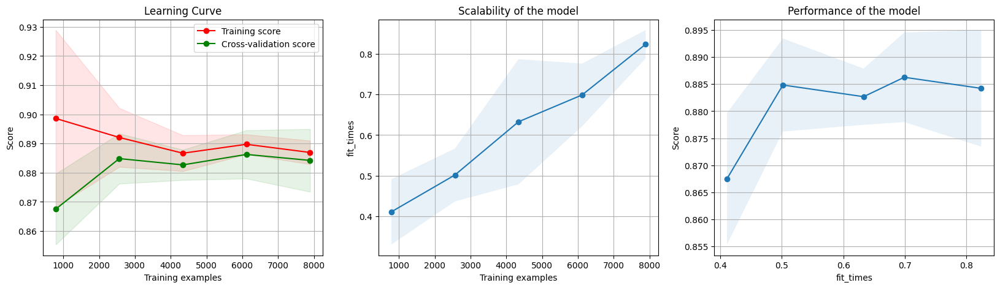

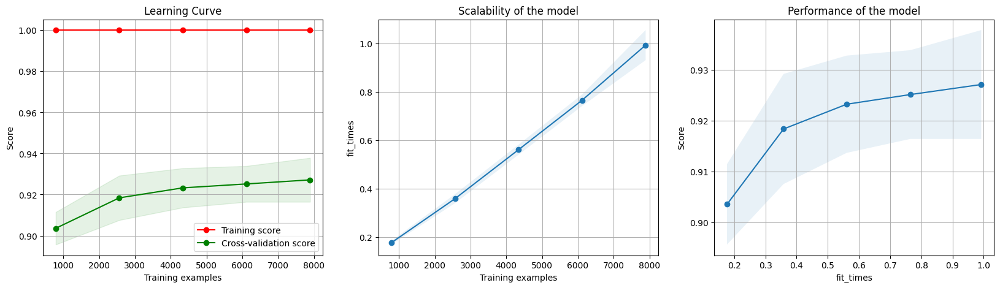

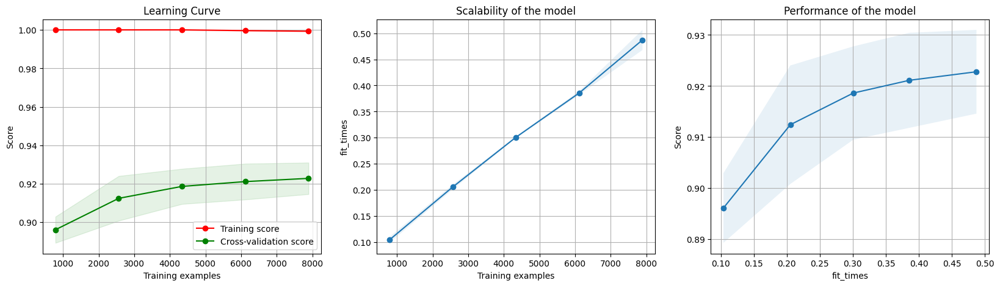

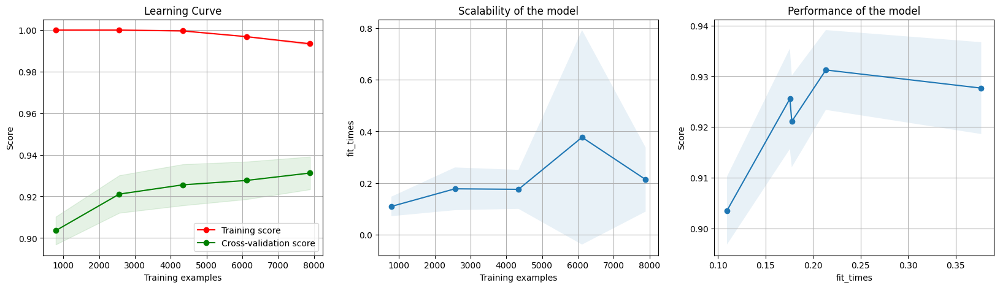

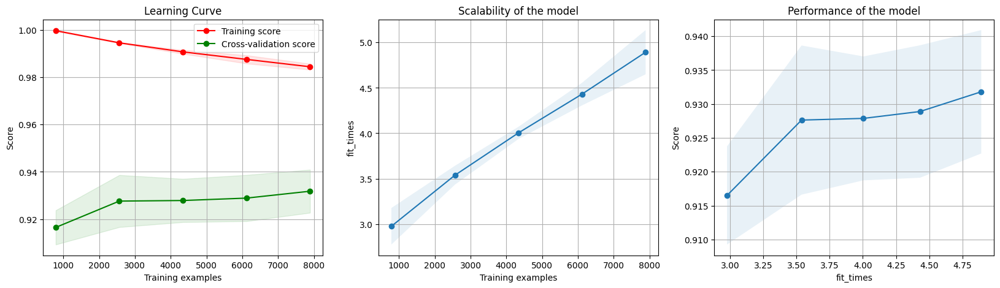

In [24]:
models=[LogisticRegression(max_iter=1000),RandomForestClassifier(),xgb.XGBClassifier(),lgb.LGBMClassifier(),CatBoostClassifier()]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

X_train=pd.get_dummies(X_train,columns=[x for x in X_train.columns if X_train[x].dtype=='object'])
X_val=pd.get_dummies(X_val,columns=[x for x in X_val.columns if X_val[x].dtype=='object'])

for clf in models:
    clf=clf
    clf.fit(X_train,y_train)
    y_pred=clf.predict_proba(X_val)[:,1]
    fpr, tpr, thresholds = roc_curve(y_val, y_pred)
    # get the best threshold
    J = tpr - fpr
    ix = argmax(J)
    best_thresh = thresholds[ix]

    y_pred = (y_pred > best_thresh).astype(int)
    print('----------------------------------------------------')
    print('Model:',clf)
    print_metrics(y_val,y_pred)
    print('----------------------------------------------------')
    #plot_confusion_matrix(y_val,y_pred)
    #plot_roc_curve(y_val,y_pred)
    #plot_feature_importances(clf,X_val)
    plot_learning_curve(clf, "Learning Curve", X_train, y_train, cv=5, scoring='roc_auc')
    metrics_df=evaluate(metrics_df,clf,y_val,y_pred,best_thresh)
    
metrics_df


#### XGBoost

In [165]:
spw=df[df.Revenue==1].shape[0]/df[df.Revenue==0].shape[0]
spw

0.18307426597582038

C:\Users\Manuel\AppData\Local\Temp\ipykernel_22932\565972637.py:16: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13.699999999999818' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[(X[col]>=np.quantile(X[col],self.upper_bound)),col]=np.quantile(X[col],self.upper_bound)
C:\Users\Manuel\AppData\Local\Temp\ipykernel_22932\2599958516.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[new_col_mult] = X[col1] * X[col2]
C:\Users\Manuel\AppData\Local\Temp\ipykernel_22932\2599958516.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance. 

Best Threshold=0.025279
Accuracy: 0.8390105433901054
Precision: 0.5101156069364162
Recall: 0.8588807785888077
F1-Score: 0.6400725294650952
AUC-Score: 0.8469586374695863
PRAUC: 0.6963


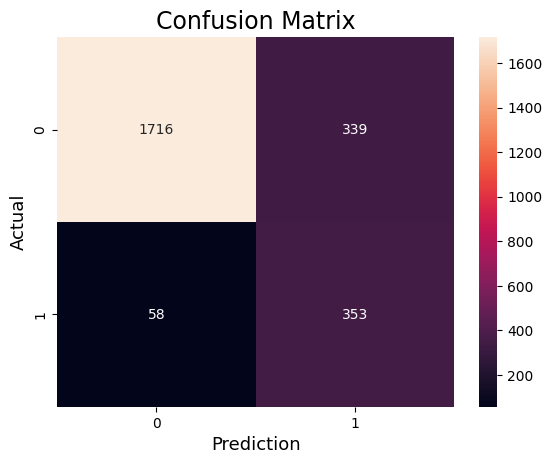

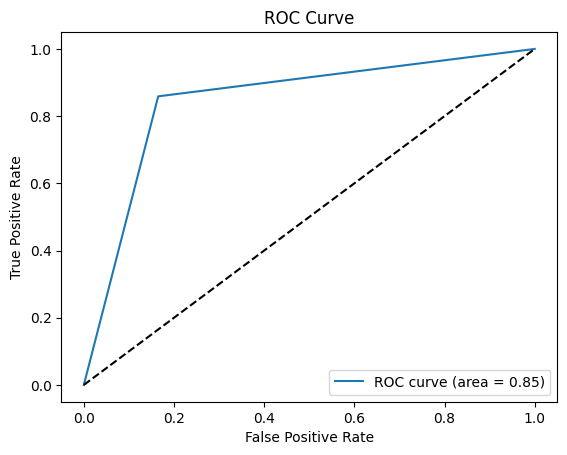

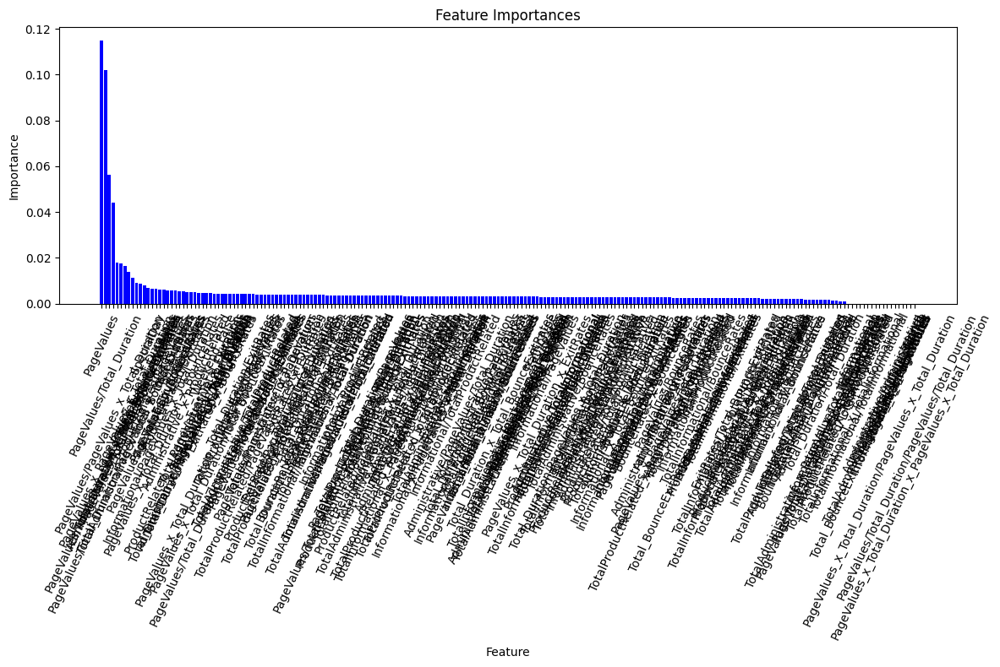

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


,Modelo,Accuracy,Precision,Recall,F1,AUC,PRAUC,Threshold,Parametros,Fecha
0,LogisticRegression(max_iter=1000),0.803731,0.450742,0.812652,0.579861,0.807299,0.397521,0.128550,"{'C': 1.0, 'class_weight': None, 'dual': False...",2024-07-06 08:28:23.918280
1,RandomForestClassifier(),0.859286,0.551780,0.829684,0.662779,0.847445,0.486189,0.190000,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",2024-07-06 08:28:41.387303
2,"XGBClassifier(base_score=None, booster=None, c...",0.819546,0.477273,0.868613,0.616048,0.839173,0.436463,0.074917,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:28:50.812174
3,LGBMClassifier(),0.842660,0.516937,0.854015,0.644037,0.847202,0.465802,0.112509,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 08:28:57.335550
4,<catboost.core.CatBoostClassifier object at 0x...,0.864964,0.565217,0.822384,0.669970,0.847932,0.494429,0.155236,{},2024-07-06 08:30:43.426900
5,"XGBClassifier(base_score=None, booster=None, c...",0.848337,0.527166,0.873479,0.657509,0.858394,0.481555,0.035205,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:39:56.205448
6,"LGBMClassifier(boosting_type='dart', learning_...",0.862530,0.557692,0.846715,0.672464,0.856204,0.497754,0.239491,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 08:42:44.141082
7,<catboost.core.CatBoostClassifier object at 0x...,0.832928,0.499307,0.875912,0.636042,0.850122,0.458030,0.086639,"{'loss_function': 'Logloss', 'verbose': False,...",2024-07-06 08:57:06.988415
8,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:27:11.897482
9,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:28:44.363910


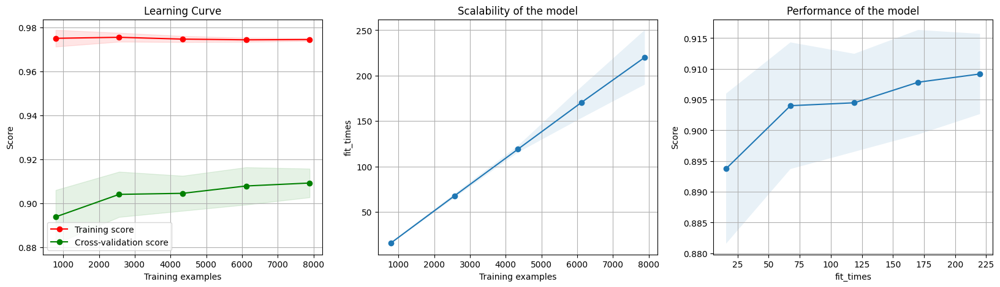

In [171]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
transformers=load_transformers('Pipelines')


for trans in transformers:
    X_train=trans.transform(X_train)
    X_val=trans.transform(X_val)

# X_train.drop('Month',axis=1,inplace=True)
# X_val.drop('Month',axis=1,inplace=True)

skf=StratifiedKFold(n_splits=5,shuffle=True)
param_grid={
            'n_estimators': [500],
            'max_depth': [10],
            'learning_rate': [0.01],
            'scale_pos_weight': [spw]
        }
        
clf = xgb.XGBClassifier(eval_metric='logloss',use_label_encoder=False,objective='binary:logistic')
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh = thresholds[ix]

print('Best Threshold=%f' % (best_thresh))
y_pred = (y_pred > best_thresh).astype(int)
print_metrics(y_val,y_pred)
plot_confusion_matrix(y_val,y_pred)
plot_roc_curve(y_val,y_pred)
plot_feature_importances(best_estimator,X_val)
plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')
metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred,best_thresh)
metrics_df


In [167]:
X_train

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,BounceRates/BounceRates,BounceRates_x_Total_BounceExitRates,BounceRates/Total_BounceExitRates,Total_BounceExitRates_x_Total_BounceExitRates,Total_BounceExitRates/Total_BounceExitRates,Weekend_False,Weekend_True,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
1785,-0.930456,-0.574034,-0.485341,-0.322519,-0.735662,-0.722177,-0.143545,0.440830,-0.492514,-0.312571,...,1.0,-0.026278,-0.784128,0.033512,1.0,True,False,False,False,True
10407,0.359614,-0.464237,-0.485341,-0.322519,1.390114,0.220219,-0.412565,-0.614254,0.579591,-0.312571,...,1.0,0.222822,0.763882,0.291697,1.0,True,False,False,False,True
286,-0.930456,-0.574034,-0.485341,-0.322519,-2.001927,-0.788646,3.716341,3.231202,-0.492514,-0.312571,...,1.0,13.048194,1.058475,12.327351,1.0,True,False,False,False,True
6520,1.173558,-0.188176,2.863272,4.342685,-0.998436,-0.736450,-0.469178,-0.518812,1.311513,-0.312571,...,1.0,0.243014,0.905826,0.268279,1.0,True,False,True,False,False
12251,-0.930456,-0.574034,0.956828,-0.260973,-0.531839,-0.593437,0.431204,0.001649,-0.492514,-0.312571,...,1.0,0.106627,1.743802,0.061146,1.0,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,2.081494,4.161926,-0.485341,-0.322519,0.340942,-0.276244,-0.469178,-0.575060,-0.492514,-0.312571,...,1.0,0.257642,0.854395,0.301550,1.0,True,False,False,False,True
5191,-0.930456,-0.574034,-0.485341,-0.322519,-0.161480,-0.550757,-0.469178,-0.581601,2.088106,-0.312571,...,1.0,0.259344,0.848790,0.305545,1.0,False,True,False,False,True
5390,-0.930456,-0.574034,-0.485341,-0.322519,-1.368795,-0.656408,-0.469178,0.542950,-0.492514,-0.312571,...,1.0,-0.033125,-6.645374,0.004985,1.0,True,False,False,False,True
860,-0.930456,-0.574034,-0.485341,-0.322519,-0.224499,-0.575246,-0.469178,-0.552801,-0.492514,-0.312571,...,1.0,0.251854,0.874033,0.288151,1.0,True,False,True,False,False


#### LightGBM

In [268]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
transformers=load_transformers('Pipelines')

for trans in transformers:
    X_train=trans.transform(X_train)
    X_val=trans.transform(X_val)

# X_train.drop('Month',axis=1,inplace=True)
# X_val.drop('Month',axis=1,inplace=True)

skf=StratifiedKFold(n_splits=5,shuffle=True)
param_grid = {
        'boosting_type':['dart'],
        'learning_rate': [0.01],
        'n_estimators': [400],
        'max_depth': [10],
        }
        
clf = lgb.LGBMClassifier(objective='binary',metric='binary_logloss',)
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds=np.arange(0,1,0.001)
f1_scores=[f1_score(y_val,(y_pred>thr).astype(int)) for thr in thresholds]
ix=argmax(f1_scores)
best_thresh_f1=thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh=(best_thresh_auc+best_thresh_f1)/2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val,y_pred_bin)
plot_confusion_matrix(y_val,y_pred_bin)
plot_roc_curve(y_val,y_pred_bin)
plot_feature_importances(best_estimator,X_val)
plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred_bin,best_thresh)
metrics_df
with open('LBGM_Model_F1_0.69.pkl', 'wb') as file:
    pickle.dump(best_estimator, file)

In [262]:
best_estimator.get_params()

{'boosting_type': 'dart',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.01,
 'max_depth': 10,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 300,
 'n_jobs': None,
 'num_leaves': 50,
 'objective': 'binary',
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'metric': 'binary_logloss'}

In [242]:
metrics_df.sort_values(by='F1',ascending=False)

,Modelo,Accuracy,Precision,Recall,F1,AUC,PRAUC,Threshold,Parametros,Fecha,Pipelines
0,"LGBMClassifier(boosting_type='dart', learning_...",0.880373,0.607807,0.795620,0.689146,0.846472,0.517647,0.300691,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 10:30:43.234939,None
0,"LGBMClassifier(boosting_type='dart', learning_...",0.879968,0.606679,0.795620,0.688421,0.846229,0.516750,0.306910,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 17:04:13.361716,"[1_outlier_transformer.pkl, 2_new_variables.pk..."
0,"LGBMClassifier(boosting_type='dart', learning_...",0.879562,0.605556,0.795620,0.687697,0.845985,0.515856,0.308114,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 11:11:01.844036,None
0,"LGBMClassifier(boosting_type='dart', learning_...",0.877534,0.600000,0.795620,0.684100,0.844769,0.511436,0.304138,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 17:01:44.171596,"[1_outlier_transformer.pkl, 2_new_variables.pk..."
0,"LGBMClassifier(boosting_type='dart', learning_...",0.877534,0.600000,0.795620,0.684100,0.844769,0.511436,0.304138,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 15:23:53.539909,"[1_outlier_transformer.pkl, 2_new_variables.pk..."
0,LGBMClassifier(bagging_fraction=0.300000000000...,0.878345,0.604915,0.778589,0.680851,0.838443,0.507882,0.212958,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 12:07:54.933519,None
0,LGBMClassifier(bagging_fraction=0.300000000000...,0.877940,0.603383,0.781022,0.680806,0.839173,0.507752,0.214071,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 12:07:09.706093,None
0,LGBMClassifier(bagging_fraction=0.300000000000...,0.875507,0.594891,0.793187,0.679875,0.842579,0.506328,0.200420,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 12:04:35.424118,None
0,LGBMClassifier(bagging_fraction=0.300000000000...,0.877129,0.601124,0.781022,0.679365,0.838686,0.505987,0.216005,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 12:08:39.298030,None
9,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:28:44.363910,None


#### CatBoost

Best Threshold=0.098005
Accuracy: 0.8495539334955393
Precision: 0.5306748466257669
Recall: 0.8418491484184915
F1-Score: 0.6509877704609596
AUC-Score: 0.8464720194647202
PRAUC: 0.6994


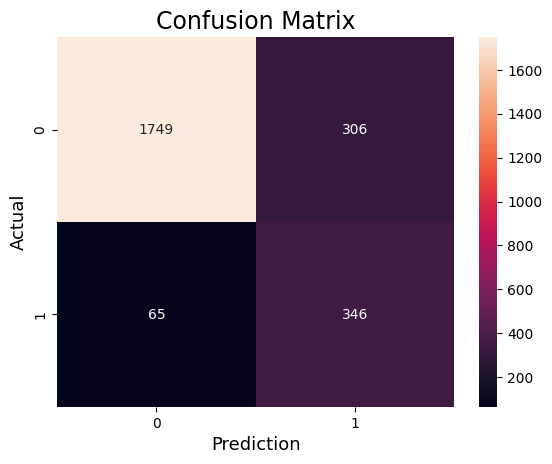

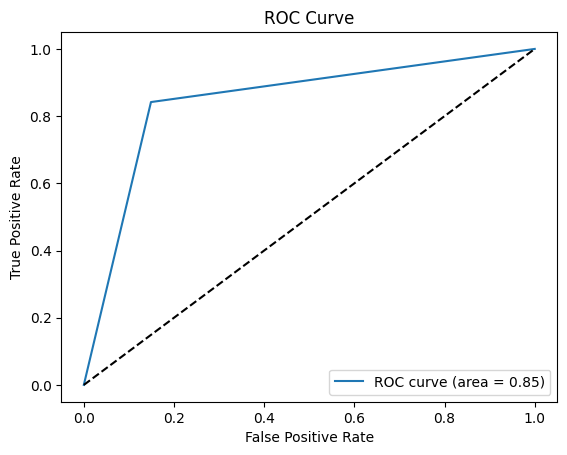

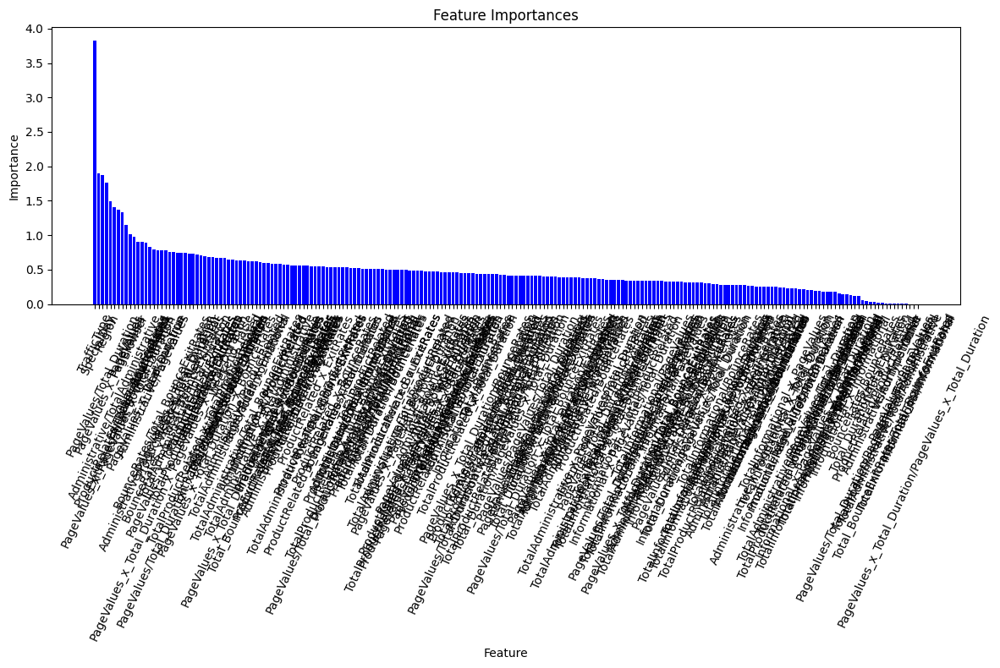

KeyboardInterrupt: 

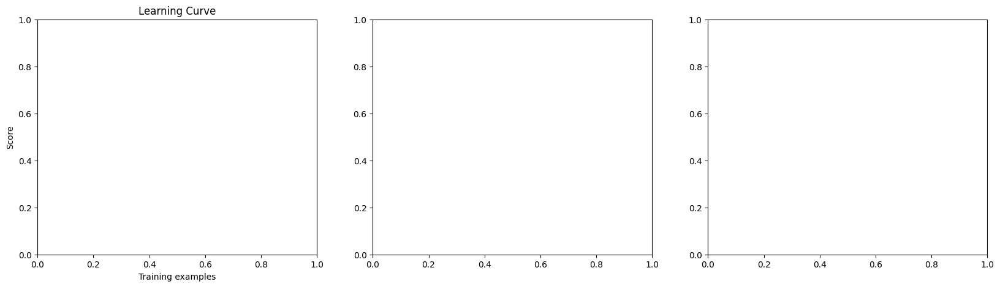

In [173]:
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
# transformers = load_transformers('Pipelines')

# for trans in transformers:
#     X_train = trans.transform(X_train)
#     X_val = trans.transform(X_val)

skf = StratifiedKFold(n_splits=5, shuffle=True)
param_grid = {
    'learning_rate': [0.01],
    'depth': [10],
    'iterations': [1000]
}

clf = CatBoostClassifier(loss_function='Logloss', eval_metric='AUC', verbose=False)
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh = thresholds[ix]

print('Best Threshold=%f' % (best_thresh))
y_pred = (y_pred > best_thresh).astype(int)
print_metrics(y_val, y_pred)
plot_confusion_matrix(y_val, y_pred)
plot_roc_curve(y_val, y_pred)
plot_feature_importances(best_estimator, X_val)
plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

metrics_df = evaluate(metrics_df, best_estimator, y_val, y_pred, best_thresh)
metrics_df

#### LGBM TargetEncoding with Optuna

In [247]:
from optuna.integration import LightGBMPruningCallback
import lightgbm as lgb
import optuna

def objective(trial, X, y):
    param_grid = {
        "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train_fold, X_test_fold = X.iloc[train_idx], X.iloc[test_idx]
        y_train_fold, y_test_fold = y.iloc[train_idx], y.iloc[test_idx]
        y_train_fold=y_train_fold.astype('int')
        y_test_fold=y_test_fold.astype('int')

        model = lgb.LGBMClassifier(objective="binary", **param_grid,early_stopping=100,)
        model.fit(
            X_train_fold,
            y_train_fold,
            eval_set=[(X_test_fold, y_test_fold)],
            eval_metric="binary_logloss",
            callbacks=[
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test_fold)[:, 1]
        preds= (preds>0.3).astype('int')
        cv_scores[idx] = f1_score(y_test_fold, preds)

    return np.mean(cv_scores)


study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X_train, y_train)
study.optimize(func, n_trials=20)

print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

[I 2024-07-06 17:17:24,277] A new study created in memory with name: LGBM Classifier


c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=13.426968024847909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.426968024847909
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[Lig

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=13.426968024847909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.426968024847909
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] early_stopping_round is set=100, early_stopp

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=13.426968024847909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.426968024847909
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] early_stopping_round is set=100, early_stopp

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=13.426968024847909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.426968024847909
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] early_stopping_round is set=100, early_stopp

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=3.240022623501395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.240022623501395
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=3.240022623501395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.240022623501395
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=3.240022623501395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.240022623501395
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=3.240022623501395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.240022623501395
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=14.574139511226203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.574139511226203
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=14.574139511226203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.574139511226203
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=14.574139511226203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.574139511226203
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=14.574139511226203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.574139511226203
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 16 dense feature groups (0.12 MB) transferred to GPU in 0.002522 secs. 1 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=5.033594608684041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.033594608684041
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] early_stopping_round i

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 181 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 182 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 183 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 184 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 185 is 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 351 is already reported.
  warnings.warn(


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 16 dense feature groups (0.12 MB) transferred to GPU in 0.001982 secs. 1 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=5.033594608684041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.033594608684041
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] early_stopping_round i

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=5.033594608684041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.033594608684041
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] feature_fraction is set=0.5, 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 157 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 158 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 159 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 160 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 161 is 

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 16 dense feature groups (0.12 MB) transferred to GPU in 0.002410 secs. 1 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=5.033594608684041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.033594608684041
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5
[LightGBM] [Warning] early_stopping_round i

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 162 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 163 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 164 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 165 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 166 is 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[247]	valid_0's binary_logloss: 0.23642
[LightGBM] [Warning] min_data_

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=0.8093142281298654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093142281298654
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] feature_fraction is s

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=0.8093142281298654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093142281298654
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] feature_fraction is s

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=0.8093142281298654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093142281298654
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Info] Number of data points in the train set: 7891, number of used features: 24
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 16 dense feature groups (0.12 MB) transferred to GPU in 0.054779 secs. 1 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_gain_to_split is set=0.8152002725089569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8152002725089569
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=75, reg_l

[I 2024-07-06 17:17:34,257] Trial 5 pruned. Trial was pruned at iteration 101.
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=10.259532117388149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.259532117388149
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGB

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=10.259532117388149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.259532117388149
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=10.259532117388149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.259532117388149
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=10.259532117388149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.259532117388149
[LightGBM] [Warning] lambda_l1 is set=85, reg_alpha=0.0 will be ignored. Current value: lambda_l1=85
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] bagging

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.430616926826122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.430616926826122
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.430616926826122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.430616926826122
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] There are no meanin

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.430616926826122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.430616926826122
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=3.808311317973709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.808311317973709
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] There are no meanin

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=3.808311317973709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.808311317973709
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 62 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 63 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 66 is alrea

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=3.808311317973709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.808311317973709
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=3.808311317973709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.808311317973709
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current val

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=0.10131295710836707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10131295710836707
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] There are no mean

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=0.10131295710836707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10131295710836707
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_gain_to_split is set=0.10131295710836707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10131295710836707
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=8.552067564105808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552067564105808
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGB

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002613 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002043 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001794 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 24 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 25 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 26 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 28 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001424 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002357 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002119 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 50 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 51 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 54 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002045 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002384 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001816 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 81 is alrea

[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=8.552067564105808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552067564105808
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

Training until validation scores don't improve for 100 rounds
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002461 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002074 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002178 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 32 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002262 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002021 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002588 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 38 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 39 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 40 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 42 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001892 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001555 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002134 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 64 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 65 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 68 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001398 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001497 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002171 secs. 0

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 98 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 99 is alrea

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.12 MB) transferred to GPU in 0.002260 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=8.552067564105808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552067564105808
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] early_stopping_rou

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002176 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001628 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001789 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 32 is alrea

[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002087 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001724 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001735 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 60 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.003425 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002210 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002055 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 66 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 70 is alrea

[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.002034 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001832 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.04 MB) transferred to GPU in 0.001583 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 91 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 92 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 93 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 95 is alrea

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.12 MB) transferred to GPU in 0.002075 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=8.552067564105808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.552067564105808
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] early_stopping_rou

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001957 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001371 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001621 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 32 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002810 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001703 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.03 MB) transferred to GPU in 0.003002 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 52 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 53 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 56 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001984 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001872 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.002165 secs. 0

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 77 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 78 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 81 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001782 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001994 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 15 dense feature groups (0.04 MB) transferred to GPU in 0.001980 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=5.650728796823033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.650728796823033
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002006 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001531 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001882 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 33 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002010 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001686 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.054551 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 41 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 42 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 43 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 45 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002252 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001868 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002531 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 67 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 71 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001919 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002091 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001526 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 94 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 95 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 96 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 97 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 98 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001736 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Early stopping, best iteration is:
[1]	valid_0's binary_logloss: 0.425381
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=5.650728796823033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.650728796823033
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002371 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001793 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001842 secs. 0

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 11 is already 

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002378 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001978 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002442 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 32 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 33 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 34 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002332 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002778 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001995 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 59 is alrea

[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002239 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002229 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002056 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 79 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 80 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 83 is alrea

[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=5.650728796823033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.650728796823033
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] feature_fraction is set

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

Training until validation scores don't improve for 100 rounds
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001694 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002914 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001420 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 32 is alrea

[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002495 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002019 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002241 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 54 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 55 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 56 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 58 is alrea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001917 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002280 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002212 secs. 0

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 68 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 69 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 70 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 71 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 72 is alrea

[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.004539 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002136 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.009464 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 81 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 82 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 83 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 84 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 85 is alrea

[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_gain_to_split is set=5.650728796823033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.650728796823033
[LightGBM] [Warning] lambda_l1 is set=65, reg_alpha=0.0 will be ignored. Current value: lambda_l1=65
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] feature_fraction is set

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

Training until validation scores don't improve for 100 rounds
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001444 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001799 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001621 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 27 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 28 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 29 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 30 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 31 is alrea

[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002072 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001536 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.001718 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 57 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 58 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 59 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 60 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 61 is alrea

[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.104798 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002101 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (0.06 MB) transferred to GPU in 0.002091 secs. 0 sparse feature groups
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Size of 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=8.396181851471866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.396181851471866
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[Light

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=8.396181851471866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.396181851471866
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[Light

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=8.396181851471866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.396181851471866
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM]

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=14.972631705834647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.972631705834647
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 1198, number of negative: 6693
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total B

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=14.972631705834647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.972631705834647
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=14.972631705834647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.972631705834647
[LightGBM] [Warning] lambda_l1 is set=60, reg_alpha=0.0 will be ignored. Current value: lambda_l1=60
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 16 dense feature groups (0.12 MB) transferred to GPU in 0.002763 secs. 0 sparse feature groups
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=3.09222354490249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.09222354490249
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] early_stopping_rou

[I 2024-07-06 17:17:57,327] Trial 14 pruned. Trial was pruned at iteration 101.
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=11.666968816083818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.666968816083818
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] There are no mean

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=11.666968816083818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.666968816083818
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 1197, number of negative: 6694
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_gain_to_split is set=11.666968816083818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.666968816083818
[LightGBM] [Warning] lambda_l1 is set=55, reg_alpha=0.0 will be ignored. Current value: lambda_l1=55
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] feature_fraction is s

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warni

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=6.8935175938978945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.8935175938978945
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[Light

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Number of positive: 1197, number of negative: 6694
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 7891, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=6.8935175938978945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.8935175938978945
[LightGBM] [Warning] lambda_l1 is s

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=6.8935175938978945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.8935175938978945
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=15, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] baggi

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=3.2383902480049276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2383902480049276
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGB

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 44 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 45 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 46 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 47 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 48 is alrea

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=3.2383902480049276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2383902480049276
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=3.2383902480049276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2383902480049276
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGB

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.151799 -> initscore=-1.720558
[LightGBM] [Info] Start training from score -1.720558
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spl

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=10.332286403673088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.332286403673088
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] There are no mean

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=10.332286403673088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.332286403673088
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_gain_to_split is set=10.332286403673088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.332286403673088
[LightGBM] [Warning] lambda_l1 is set=75, reg_alpha=0.0 will be ignored. Current value: lambda_l1=75
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current v

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:685: UserWarning: The distribution is specified by [0.2, 0.95] and step=0.1, but the range is not divisible by `step`. It will be replaced by [0.2, 0.9].
  warnings.warn(


[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=2.1395280224136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1395280224136
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Info] Using GPU Device: NVIDIA GeForce GTX 1650, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=2.1395280224136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1395280224136
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=2.1395280224136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1395280224136
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_fre

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=2.1395280224136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1395280224136
[LightGBM] [Warning] lambda_l1 is set=100, reg_alpha=0.0 will be ignored. Current value: lambda_l1=100
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\trial\_trial.py:493: UserWarning: The reported value is ignored because this `step` 4 is already re

[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

In [250]:
study.best_params

{'device_type': 'gpu',
 'n_estimators': 10000,
 'learning_rate': 0.2154612962425625,
 'num_leaves': 1740,
 'max_depth': 4,
 'min_data_in_leaf': 4800,
 'lambda_l1': 50,
 'lambda_l2': 100,
 'min_gain_to_split': 13.426968024847909,
 'bagging_fraction': 0.7,
 'bagging_freq': 1,
 'feature_fraction': 0.30000000000000004}

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=13.426968024847909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.426968024847909
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_gain_to_split is set=13.426968024847909, min_split_gain=0.0 will be ignored. Cu

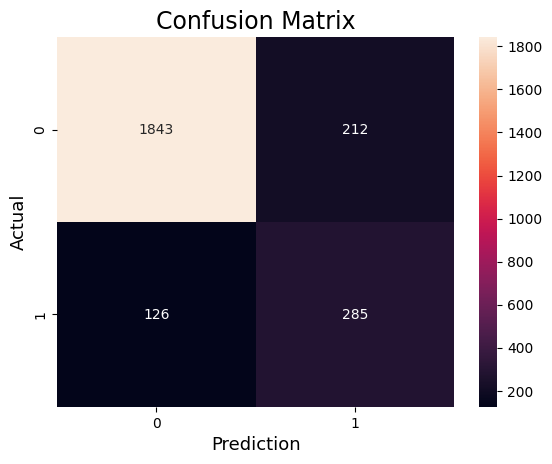

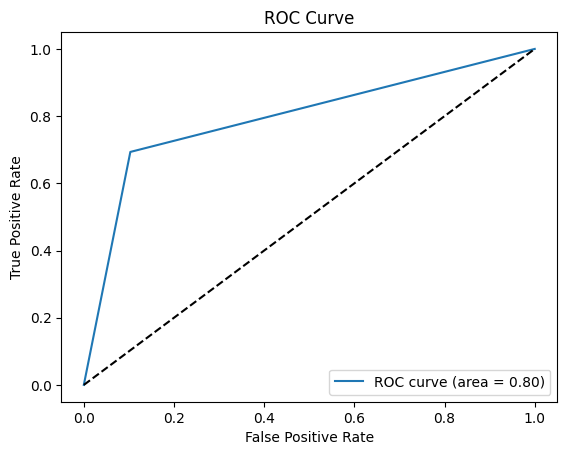

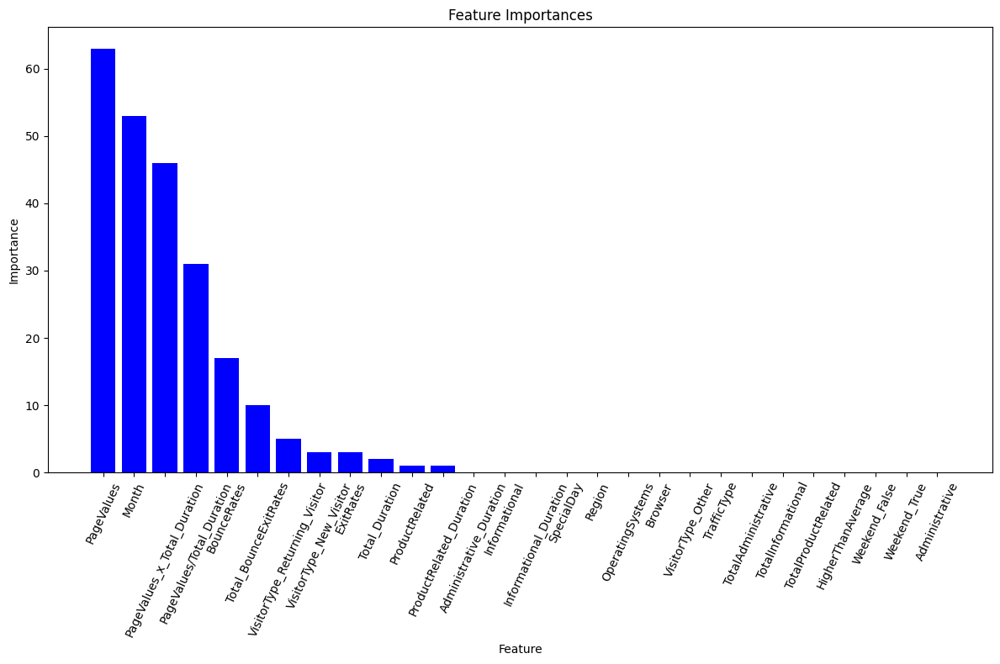

<module 'matplotlib.pyplot' from 'c:\\Users\\Manuel\\AppData\\Local\\Programs\\Python\\Python310\\lib\\site-packages\\matplotlib\\pyplot.py'>

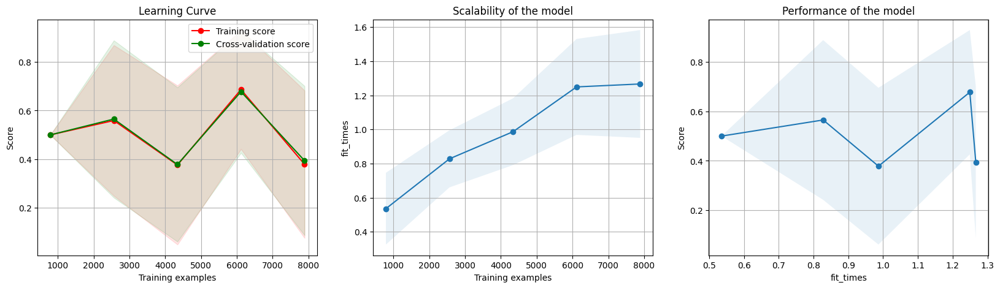

In [251]:
params={'n_estimators': 300,
 'learning_rate':study.best_params['learning_rate'],
 'num_leaves': study.best_params['num_leaves'],
 'max_depth': study.best_params['max_depth'],
 'lambda_l1': study.best_params['lambda_l1'],
 'lambda_l2': study.best_params['lambda_l2'],
 'min_gain_to_split': study.best_params['min_gain_to_split'],
 'bagging_fraction': study.best_params['bagging_fraction'],
 'bagging_freq': study.best_params['bagging_freq'],
 'feature_fraction': study.best_params['feature_fraction']}

optuna_lgb = lgb.LGBMClassifier(objective="binary",boosting_type='dart', **params)
optuna_lgb.fit(X_train, y_train)

y_pred = optuna_lgb.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds=np.arange(0,1,0.001)
f1_scores=[f1_score(y_val,(y_pred>thr).astype(int)) for thr in thresholds]
ix=argmax(f1_scores)
best_thresh_f1=thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh=(best_thresh_auc+best_thresh_f1)/2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val,y_pred_bin)
plot_confusion_matrix(y_val,y_pred_bin)
plot_roc_curve(y_val,y_pred_bin)
plot_feature_importances(optuna_lgb,X_val)
plot_learning_curve(optuna_lgb, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

# metrics_df=evaluate(metrics_df,optuna_lgb,y_val,y_pred_bin,best_thresh)
# metrics_df

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.144588791923285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.144588791923285
[LightGBM] [Warning] lambda_l1 is set=90, reg_alpha=0.0 will be ignored. Current value: lambda_l1=90
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_gain_to_split is set=12.144588791923285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.144588791923285
[LightGBM] [Warn

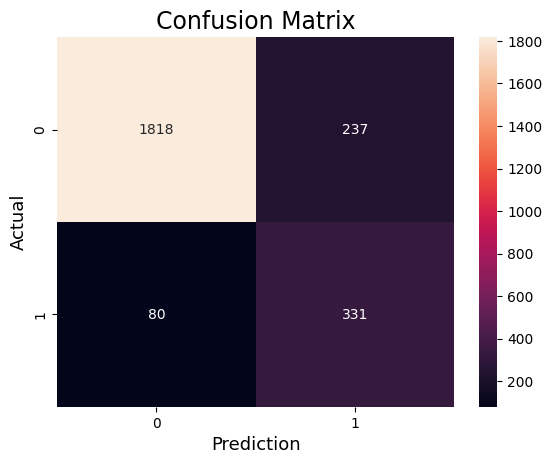

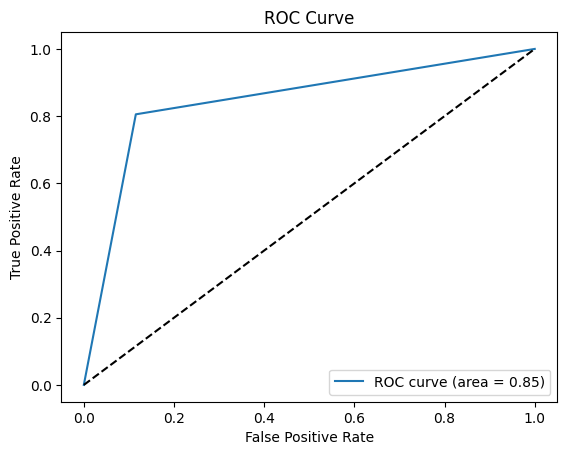

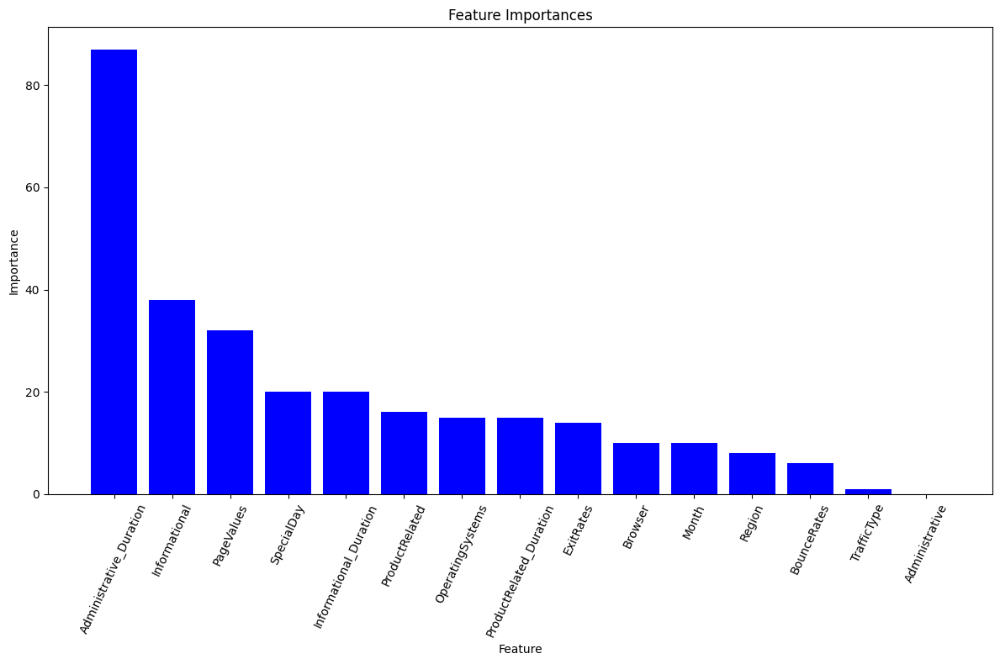

,Modelo,Accuracy,Precision,Recall,F1,AUC,PRAUC,Threshold,Parametros,Fecha
0,LogisticRegression(max_iter=1000),0.803731,0.450742,0.812652,0.579861,0.807299,0.397521,0.128550,"{'C': 1.0, 'class_weight': None, 'dual': False...",2024-07-06 08:28:23.918280
1,RandomForestClassifier(),0.859286,0.551780,0.829684,0.662779,0.847445,0.486189,0.190000,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...",2024-07-06 08:28:41.387303
2,"XGBClassifier(base_score=None, booster=None, c...",0.819546,0.477273,0.868613,0.616048,0.839173,0.436463,0.074917,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:28:50.812174
3,LGBMClassifier(),0.842660,0.516937,0.854015,0.644037,0.847202,0.465802,0.112509,"{'boosting_type': 'gbdt', 'class_weight': None...",2024-07-06 08:28:57.335550
4,<catboost.core.CatBoostClassifier object at 0x...,0.864964,0.565217,0.822384,0.669970,0.847932,0.494429,0.155236,{},2024-07-06 08:30:43.426900
5,"XGBClassifier(base_score=None, booster=None, c...",0.848337,0.527166,0.873479,0.657509,0.858394,0.481555,0.035205,"{'objective': 'binary:logistic', 'use_label_en...",2024-07-06 08:39:56.205448
6,"LGBMClassifier(boosting_type='dart', learning_...",0.862530,0.557692,0.846715,0.672464,0.856204,0.497754,0.239491,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 08:42:44.141082
7,<catboost.core.CatBoostClassifier object at 0x...,0.832928,0.499307,0.875912,0.636042,0.850122,0.458030,0.086639,"{'loss_function': 'Logloss', 'verbose': False,...",2024-07-06 08:57:06.988415
8,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:27:11.897482
9,"LGBMClassifier(boosting_type='dart', learning_...",0.867397,0.569767,0.834550,0.677196,0.854258,0.503074,0.279381,"{'boosting_type': 'dart', 'class_weight': None...",2024-07-06 09:28:44.363910


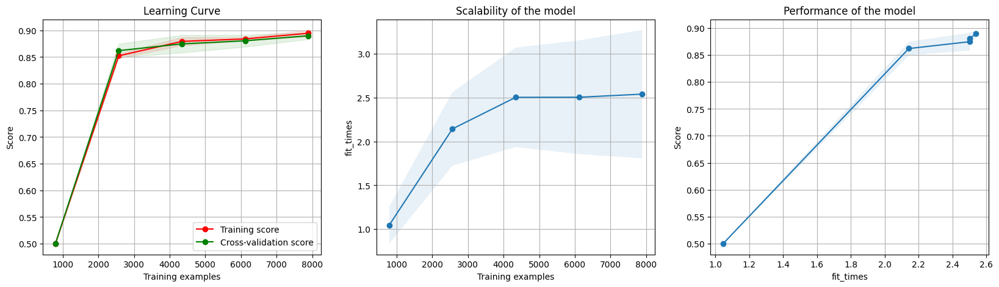

In [200]:
params={'n_estimators': 300,
 'learning_rate':study.best_params['learning_rate'],
 'num_leaves': study.best_params['num_leaves'],
 'max_depth': study.best_params['max_depth'],
 'lambda_l1': study.best_params['lambda_l1'],
 'lambda_l2': study.best_params['lambda_l2'],
 'min_gain_to_split': study.best_params['min_gain_to_split'],
 'bagging_fraction': study.best_params['bagging_fraction'],
 'bagging_freq': study.best_params['bagging_freq'],
 'feature_fraction': study.best_params['feature_fraction']}

optuna_lgb = lgb.LGBMClassifier(objective="binary",boosting_type='dart', **params)
optuna_lgb.fit(X_train[X_train.columns[indices][0:15]], y_train)

y_pred = optuna_lgb.predict_proba(X_val[X_train.columns[indices][0:15]])[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds=np.arange(0,1,0.001)
f1_scores=[f1_score(y_val,(y_pred>thr).astype(int)) for thr in thresholds]
ix=argmax(f1_scores)
best_thresh_f1=thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh=(best_thresh_auc+best_thresh_f1)/2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val,y_pred_bin)
plot_confusion_matrix(y_val,y_pred_bin)
plot_roc_curve(y_val,y_pred_bin)
plot_feature_importances(optuna_lgb,X_val)
plot_learning_curve(optuna_lgb, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

metrics_df=evaluate(metrics_df,optuna_lgb,y_val,y_pred_bin,best_thresh)
metrics_df

['1_outlier_transformer.pkl',
 '2_new_variables.pkl',
 '3_log_transformer.pkl',
 '4_standarize_transformer.pkl',
 '5_generic_feature_engineering.pkl',
 '6_column_check.pkl',
 '7_OneHotEncoding.pkl',
 '8_FrequencyEncoding.pkl',
 '9_TargetEncoding.pkl']

#### MlFlow

In [32]:
import mlflow
from mlflow.models import infer_signature


Funciones de plot con fig para guardar en MLFlow

In [32]:
def plot_confusion_matrix(y_true, y_pred):
    fig, ax = plt.subplots()
    sns.heatmap(confusion_matrix(y_true, y_pred),
                annot=True,
                fmt='g',
                xticklabels=['0', '1'],
                yticklabels=['0', '1'],
                ax=ax)
    ax.set_ylabel('Actual', fontsize=13)
    ax.set_xlabel('Prediction', fontsize=13)
    ax.set_title('Confusion Matrix', fontsize=17)
    fig.savefig('Visualizaciones/Confusion_matrix.png')
    return fig

def plot_roc_curve(y_true, y_pred):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    fig, ax = plt.subplots()
    ax.plot(fpr, tpr, label=f'ROC curve (area = {auc:.2f})')
    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('ROC Curve')
    ax.legend(loc="lower right")
    fig.savefig('Visualizaciones/ROC_curve.png')
    return fig

def plot_feature_importances(clf, X, style="seaborn", plot_size=(10, 8)):
    importances = clf.feature_importances_
    indices = np.argsort(importances)[::-1]
    feature_names = X.columns[indices]
    fig, ax = plt.subplots(figsize=plot_size)
    ax.set_title("Feature Importances")
    ax.bar(range(len(indices)), importances[indices], color="b", align="center")
    ax.set_xticks(range(len(indices)))
    ax.set_xticklabels(feature_names, rotation=65)
    ax.set_xlabel("Feature")
    ax.set_ylabel("Importance")
    fig.tight_layout()
    fig.savefig('Visualizaciones/Feature_importances.png')
    return fig

def plot_learning_curve(estimator, title, X, y, axes=None, ylim=None, cv=None, n_jobs=None, scoring=None, train_sizes=np.linspace(0.1, 1.0, 5)):
    if axes is None:
        fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    else:
        fig = plt.figure(figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator,
        X,
        y,
        scoring=scoring,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        return_times=True,
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    axes[0].fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    axes[0].plot(
        train_sizes, train_scores_mean, "o-", color="r", label="Training score"
    )
    axes[0].plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, "o-")
    axes[1].fill_between(
        train_sizes,
        fit_times_mean - fit_times_std,
        fit_times_mean + fit_times_std,
        alpha=0.1,
    )
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    fit_time_argsort = fit_times_mean.argsort()
    fit_time_sorted = fit_times_mean[fit_time_argsort]
    test_scores_mean_sorted = test_scores_mean[fit_time_argsort]
    test_scores_std_sorted = test_scores_std[fit_time_argsort]
    axes[2].grid()
    axes[2].plot(fit_time_sorted, test_scores_mean_sorted, "o-")
    axes[2].fill_between(
        fit_time_sorted,
        test_scores_mean_sorted - test_scores_std_sorted,
        test_scores_mean_sorted + test_scores_std_sorted,
        alpha=0.1,
    )
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    fig.savefig('Visualizaciones/Learning_curve.png')
    return fig

In [24]:
%env MLFLOW_TRACKING_URI=sqlite:///mlruns.db

env: MLFLOW_TRACKING_URI=sqlite:///mlruns.db


Uso los tracking como diferents formas de probar cambios en el dataset.

In [25]:
# mlflow.set_tracking_uri('sqlite:///mlruns.db')
# mlflow.set_experiment('Online Shoppers Intentions - New Pipeline')

##### LGBM

In [23]:

# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
# transformers=load_transformers('Pipelines')
# #mlflow.set_tracking_uri('https://127.0.0.1:8080')
#mlflow.set_experiment('Online Shoppers Intentions - New Pipeline')



X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
transformers = load_transformers('Pipelines')

for trans in transformers:
    X_train = trans.transform(X_train)
    X_val = trans.transform(X_val)

# X_train.drop('Month',axis=1,inplace=True)
# X_val.drop('Month',axis=1,inplace=True)
signature=infer_signature(X_train, y_train)
skf=StratifiedKFold(n_splits=5,shuffle=True)
param_grid = {
        'boosting_type':['dart'],
        'learning_rate': [0.01],
        'n_estimators': [400],
        'max_depth': [10],
        }

clf = lgb.LGBMClassifier(objective='binary',metric='binary_logloss',)
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_


y_pred = best_estimator.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds=np.arange(0,1,0.001)
f1_scores=[f1_score(y_val,(y_pred>thr).astype(int)) for thr in thresholds]
ix=argmax(f1_scores)
best_thresh_f1=thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh=(best_thresh_auc+best_thresh_f1)/2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val,y_pred_bin)
fig1=plot_confusion_matrix(y_val,y_pred_bin)
fig2=plot_roc_curve(y_val,y_pred_bin)
fig3=plot_feature_importances(best_estimator,X_val)
fig4=plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

visualizaciones={fig1:'Visualizaciones/Confusion_matrix.png',fig2:'Visualizaciones/ROC_curve.png',fig3:'Visualizaciones/Feature_Importances.png',fig4:'Visualizaciones/Learning_curve.png'}

    
    
metrics={'Accuracy':accuracy_score(y_val,y_pred_bin),'Precision':precision_score(y_val,y_pred_bin),'Recall':recall_score(y_val,y_pred_bin),'F1':f1_score(y_val,y_pred_bin),'AUC':roc_auc_score(y_val,y_pred_bin),'PRAUC':average_precision_score(y_val,y_pred_bin),'Threshold':best_thresh}
metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred_bin,best_thresh)
metrics_df
#mlflow.end_run()
with mlflow.start_run(run_name='Best LGBM Classifier') as run:
    
    for i in range(len(transformers_names)):
        mlflow.log_artifact(f"Pipelines/{transformers_names[i]}", "Pipelines")
    mlflow.log_params(param_grid)
    for key,value in visualizaciones.items():
        mlflow.log_figure(key,value)
    mlflow.log_metrics(metrics)
    mlflow.set_tag("Training Info", "LGBM Model")
    signature = infer_signature(X_train, (best_estimator.predict_proba(X_train)[:,1]>best_thresh).astype(int))
    mlflow.sklearn.log_model(best_estimator, "LGBM Model",signature=signature)
    mlflow.end_run()




c:\Users\Manuel\OneDrive - ITBA\ITBA\Año 3\2º Cuatrimestre\Análisis Predictivo\Final\class_and_functions.py:252: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13.699999999999818' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[(X[col] >= np.quantile(X[col], self.upper_bound)), col] = np.quantile(X[col], self.upper_bound)
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py

NameError: name 'infer_signature' is not defined

##### XGBOOST

c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")


Best Threshold=0.105000
Best Threshold=0.068491
Accuracy: 0.8787510137875101
Precision: 0.6056603773584905
Recall: 0.781021897810219
F1-Score: 0.6822529224229543
AUC-Score: 0.8396593673965936
PRAUC: 0.7116


c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\sklearn.py:1395: UserWarning: `use_label_encoder` is deprecated in 1.7.0.
  warnings.warn("`use_label_encoder` is deprecated in 1.7.0.")
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\_distutils_hack\__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


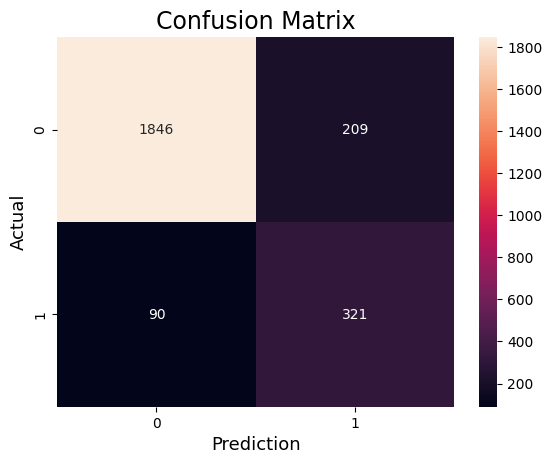

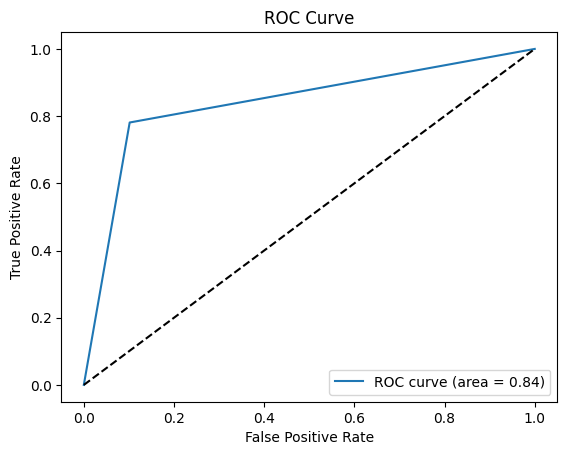

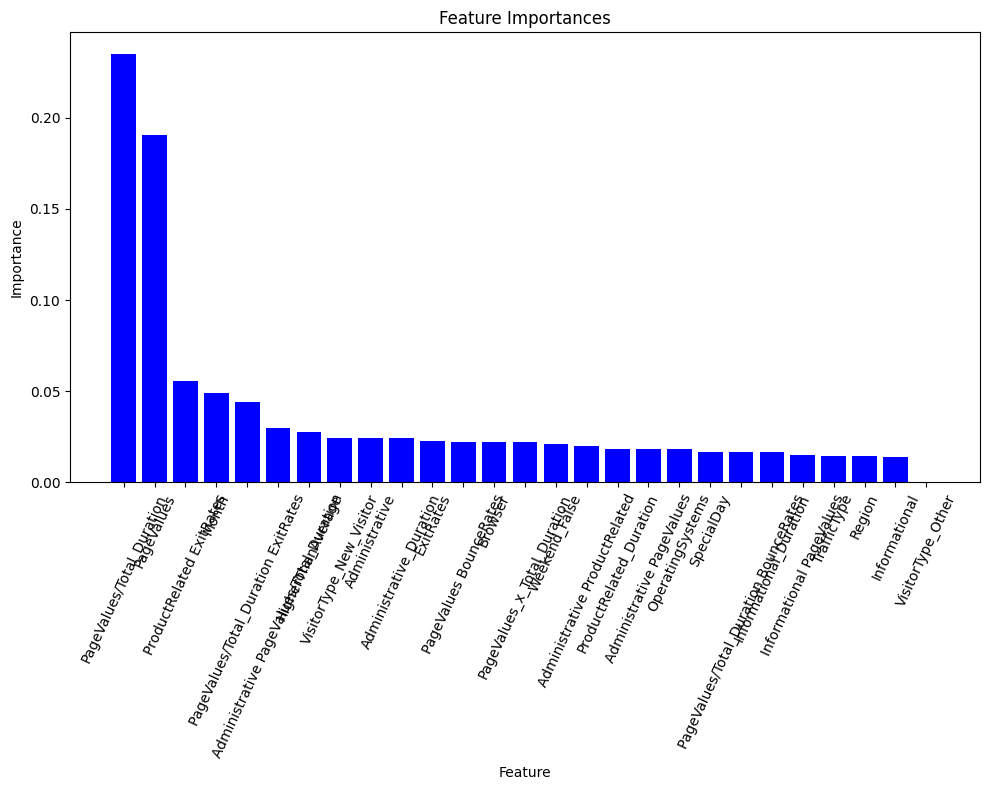

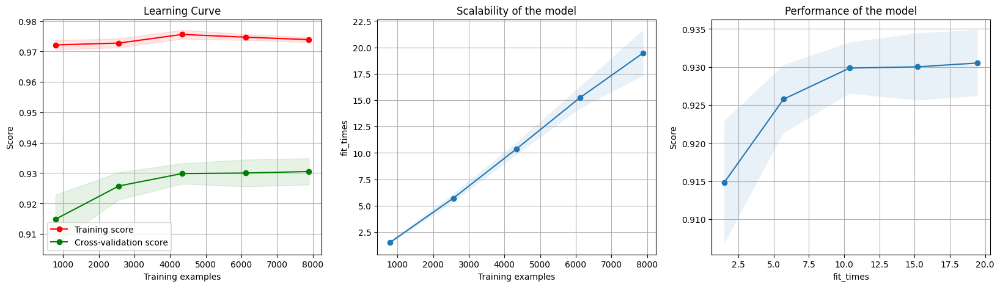

In [149]:
signature = infer_signature(X_train, y_train)

skf=StratifiedKFold(n_splits=5,shuffle=True)
param_grid={
            'n_estimators': [500],
            'max_depth': [10],
            'learning_rate': [0.01],
            'scale_pos_weight': [0.18307]
        }
        
clf = xgb.XGBClassifier(eval_metric='logloss',use_label_encoder=False,objective='binary:logistic')
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds=np.arange(0,1,0.001)
f1_scores=[f1_score(y_val,(y_pred>thr).astype(int)) for thr in thresholds]
ix=argmax(f1_scores)
best_thresh_f1=thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh=(best_thresh_auc+best_thresh_f1)/2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val,y_pred_bin)
fig1=plot_confusion_matrix(y_val,y_pred_bin)
fig2=plot_roc_curve(y_val,y_pred_bin)
fig3=plot_feature_importances(best_estimator,X_val)
fig4=plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

visualizaciones={fig1:'Visualizaciones/Confusion_matrix.png',fig2:'Visualizaciones/ROC_curve.png',fig3:'Visualizaciones/Feature_Importances.png',fig4:'Visualizaciones/Learning_curve.png'}

    
    
metrics={'Accuracy':accuracy_score(y_val,y_pred_bin),'Precision':precision_score(y_val,y_pred_bin),'Recall':recall_score(y_val,y_pred_bin),'F1':f1_score(y_val,y_pred_bin),'AUC':roc_auc_score(y_val,y_pred_bin),'PRAUC':average_precision_score(y_val,y_pred_bin),'Threshold':best_thresh}
metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred_bin,best_thresh)
metrics_df

with mlflow.start_run(run_name='XGB Classifier') as run:
    
    for i in range(len(transformers_names)):
        mlflow.log_artifact(f"Pipelines/{transformers_names[i]}", "Pipelines")
    mlflow.log_params(param_grid)
    for key,value in visualizaciones.items():
        mlflow.log_figure(key,value)
    mlflow.log_metrics(metrics)
    mlflow.set_tag("Training Info", "XGB Model")
    signature = infer_signature(X_train, (best_estimator.predict_proba(X_train)[:,1]>best_thresh).astype(int))
    mlflow.sklearn.log_model(best_estimator, "XGB Model", signature=signature)
    mlflow.end_run()

##### RandomForest

Best Threshold=0.287000
Best Threshold=0.222273
Accuracy: 0.8763179237631792
Precision: 0.5967153284671532
Recall: 0.7956204379562044
F1-Score: 0.6819603753910324
AUC-Score: 0.8440389294403894
PRAUC: 0.7132


c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\_distutils_hack\__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


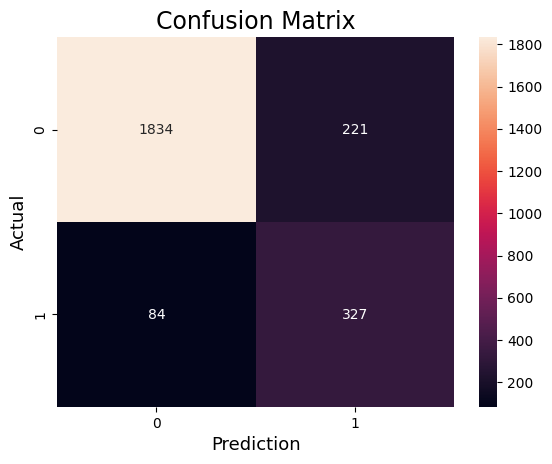

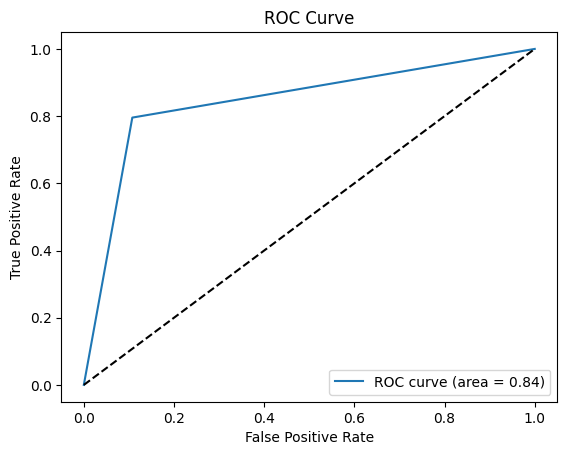

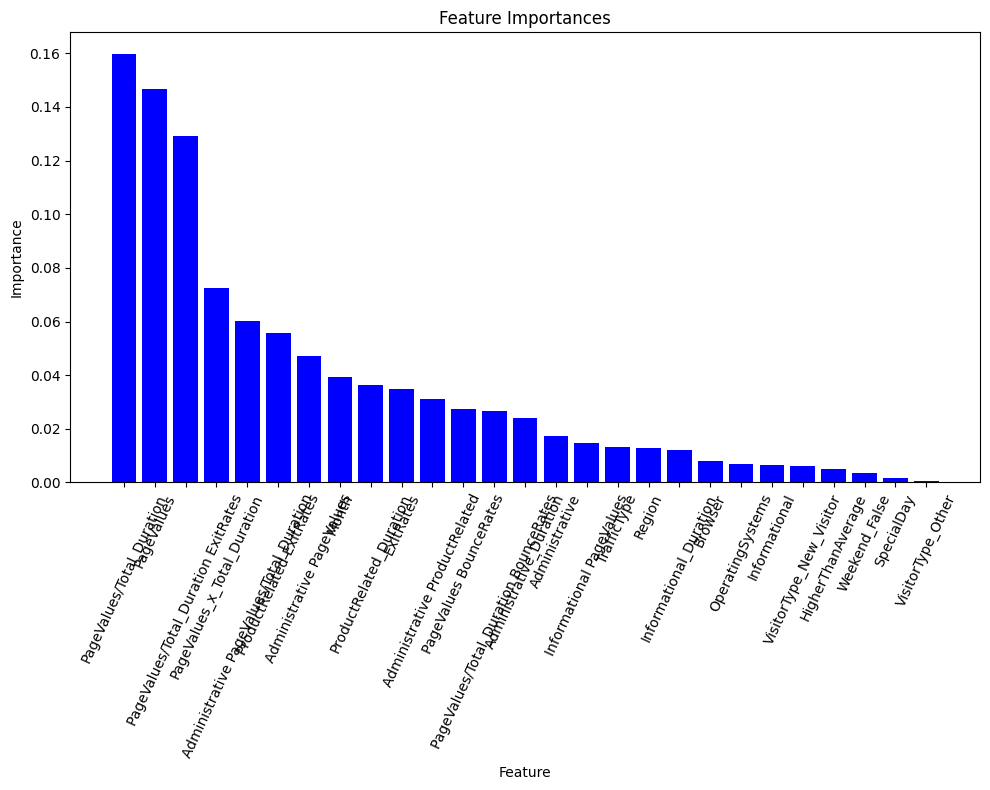

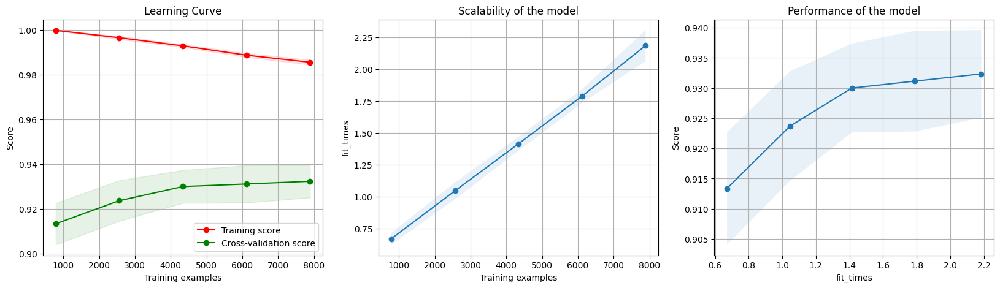

In [150]:
skf = StratifiedKFold(n_splits=5, shuffle=True)
param_grid = {
    'n_estimators': [100],  # Cambiado a un valor más común para RandomForest
    'max_depth': [10],
    'min_samples_split': [2],  # Parámetro adicional relevante para RandomForest
    'min_samples_leaf': [1]  # Parámetro adicional relevante para RandomForest
}

clf = RandomForestClassifier()
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds = np.arange(0, 1, 0.001)
f1_scores = [f1_score(y_val, (y_pred > thr).astype(int)) for thr in thresholds]
ix = argmax(f1_scores)
best_thresh_f1 = thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh = (best_thresh_auc + best_thresh_f1) / 2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val, y_pred_bin)
fig1 = plot_confusion_matrix(y_val, y_pred_bin)
fig2 = plot_roc_curve(y_val, y_pred_bin)
fig3 = plot_feature_importances(best_estimator, X_val)
fig4 = plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

visualizaciones = {fig1: 'Visualizaciones/Confusion_matrix.png', fig2: 'Visualizaciones/ROC_curve.png', fig3: 'Visualizaciones/Feature_Importances.png', fig4: 'Visualizaciones/Learning_curve.png'}

metrics = {'Accuracy': accuracy_score(y_val, y_pred_bin), 'Precision': precision_score(y_val, y_pred_bin), 'Recall': recall_score(y_val, y_pred_bin), 'F1': f1_score(y_val, y_pred_bin), 'AUC': roc_auc_score(y_val, y_pred_bin), 'PRAUC': average_precision_score(y_val, y_pred_bin), 'Threshold': best_thresh}
metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred_bin,best_thresh)
metrics_df
with mlflow.start_run(run_name='RandomForest Classifier') as run:
    
    for i in range(len(transformers_names)):
        mlflow.log_artifact(f"Pipelines/{transformers_names[i]}", "Pipelines")
    mlflow.log_params(param_grid)
    for key, value in visualizaciones.items():
        mlflow.log_figure(key, value)
    mlflow.log_metrics(metrics)
    mlflow.set_tag("Training Info", "RandomForest Model")
    signature = infer_signature(X_train, (best_estimator.predict_proba(X_train)[:, 1] > best_thresh).astype(int))
    mlflow.sklearn.log_model(best_estimator, "RandomForest Model", signature=signature)
    mlflow.end_run()

##### GradientBoosting

Best Threshold=0.292000
Best Threshold=0.207479
Accuracy: 0.875506893755069
Precision: 0.5959409594095941
Recall: 0.7858880778588808
F1-Score: 0.6778593913955928
AUC-Score: 0.8396593673965936
PRAUC: 0.7088


c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\_distutils_hack\__init__.py:18: UserWarning: Distutils was imported before Setuptools, but importing Setuptools also replaces the `distutils` module in `sys.modules`. This may lead to undesirable behaviors or errors. To avoid these issues, avoid using distutils directly, ensure that setuptools is installed in the traditional way (e.g. not an editable install), and/or make sure that setuptools is always imported before distutils.
  warnings.warn(
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


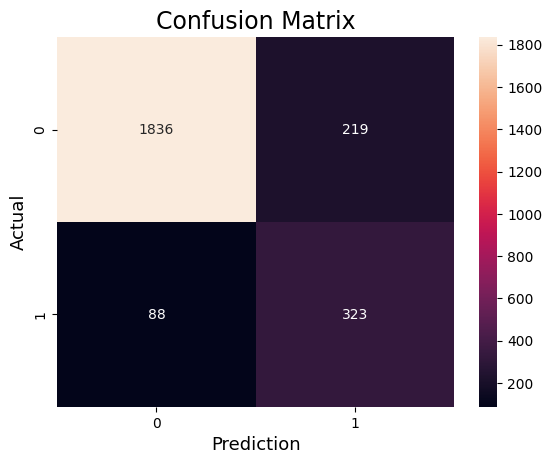

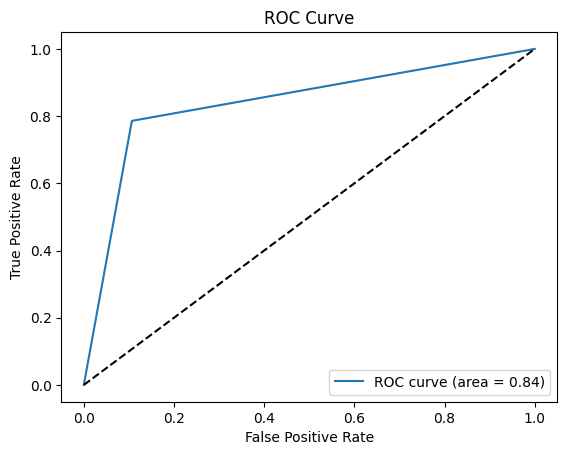

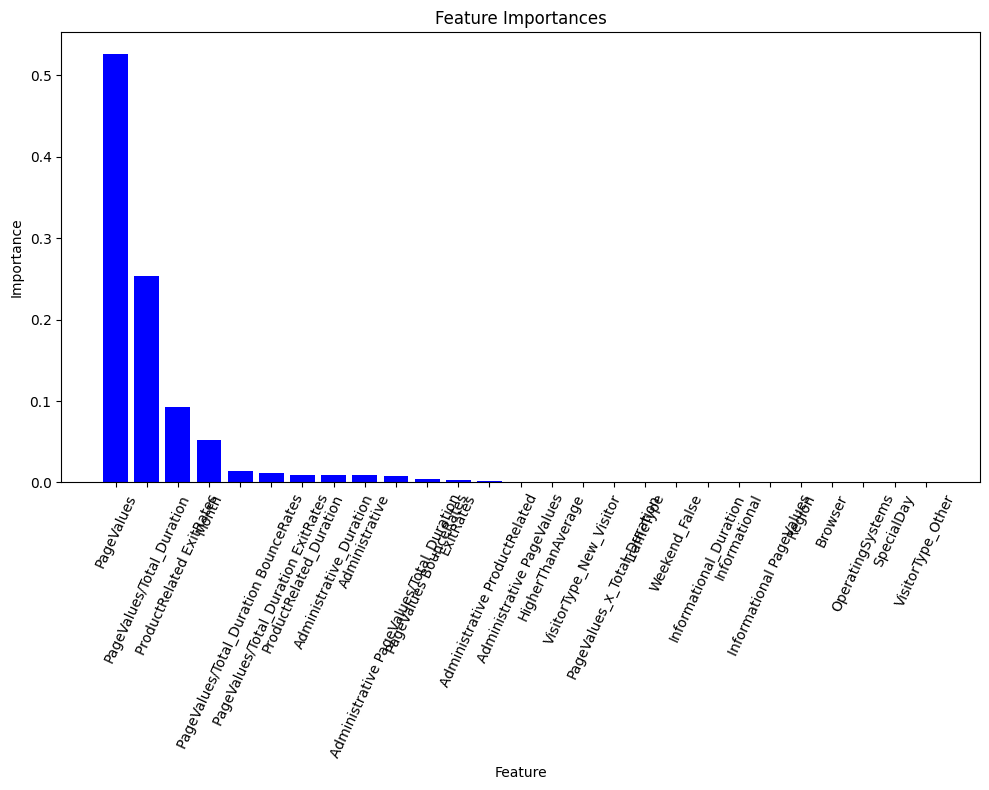

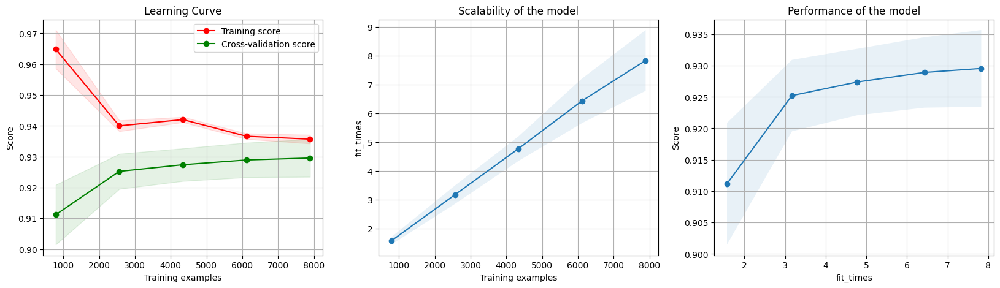

In [151]:
from sklearn.ensemble import GradientBoostingClassifier
signature=infer_signature(X_train, y_train)
skf = StratifiedKFold(n_splits=5, shuffle=True)
param_grid = {
    'n_estimators': [100, 200],  # Número de etapas de refuerzo
    'learning_rate': [0.01, 0.1],  # Tasa de aprendizaje
    'max_depth': [3, 5, 7]  # Profundidad máxima de los árboles de regresión
}

clf = GradientBoostingClassifier()
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)
best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds = np.arange(0, 1, 0.001)
f1_scores = [f1_score(y_val, (y_pred > thr).astype(int)) for thr in thresholds]
ix = argmax(f1_scores)
best_thresh_f1 = thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh = (best_thresh_auc + best_thresh_f1) / 2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val, y_pred_bin)
fig1 = plot_confusion_matrix(y_val, y_pred_bin)
fig2 = plot_roc_curve(y_val, y_pred_bin)
fig3 = plot_feature_importances(best_estimator, X_val)
fig4 = plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

visualizaciones = {fig1: 'Visualizaciones/Confusion_matrix.png', fig2: 'Visualizaciones/ROC_curve.png',fig3:'Visualizaciones/Feature_Importances.png',fig4: 'Visualizaciones/Learning_curve.png'}

metrics = {'Accuracy': accuracy_score(y_val, y_pred_bin), 'Precision': precision_score(y_val, y_pred_bin), 'Recall': recall_score(y_val, y_pred_bin), 'F1': f1_score(y_val, y_pred_bin), 'AUC': roc_auc_score(y_val, y_pred_bin), 'PRAUC': average_precision_score(y_val, y_pred_bin), 'Threshold': best_thresh}
metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred_bin,best_thresh)
metrics_df
with mlflow.start_run(run_name='LogisticRegression') as run:
    
    for i in range(len(transformers_names)):
        mlflow.log_artifact(f"Pipelines/{transformers_names[i]}", "Pipelines")
    mlflow.log_params(param_grid)
    for key, value in visualizaciones.items():
        mlflow.log_figure(key, value)
    mlflow.log_metrics(metrics)
    mlflow.set_tag("Training Info", "LogisticRegression Model")
    signature = infer_signature(X_train, (best_estimator.predict_proba(X_train)[:, 1] > best_thresh).astype(int))
    mlflow.sklearn.log_model(best_estimator, "LogisticRegression Model", signature=signature)
    mlflow.end_run()

##### LogisticRegression

Traceback (most recent call last):
  File "c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\mlflow\store\tracking\file_store.py", line 317, in search_experiments
    exp = self._get_experiment(exp_id, view_type)
  File "c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\mlflow\store\tracking\file_store.py", line 410, in _get_experiment
    meta = FileStore._read_yaml(experiment_dir, FileStore.META_DATA_FILE_NAME)
  File "c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\mlflow\store\tracking\file_store.py", line 1341, in _read_yaml
    return _read_helper(root, file_name, attempts_remaining=retries)
  File "c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\mlflow\store\tracking\file_store.py", line 1334, in _read_helper
    result = read_yaml(root, file_name)
  File "c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\mlflow\utils\file_utils.py", line 312, in read_yaml


c:\Users\Manuel\OneDrive - ITBA\ITBA\Año 3\2º Cuatrimestre\Análisis Predictivo\Final\class_and_functions.py:252: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13.699999999999818' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[(X[col] >= np.quantile(X[col], self.upper_bound)), col] = np.quantile(X[col], self.upper_bound)
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py:198: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  X[column] = X[column].astype("object").fillna(np.nan).map(col_mapping)
c:\Users\Manuel\AppData\Local\Programs\Python\Python310\lib\site-packages\category_encoders\ordinal.py

Best Threshold=0.221000
Best Threshold=0.161498
Accuracy: 0.8694241686942417
Precision: 0.5782073813708261
Recall: 0.8004866180048662
F1-Score: 0.6714285714285714
AUC-Score: 0.8418491484184916
PRAUC: 0.7060


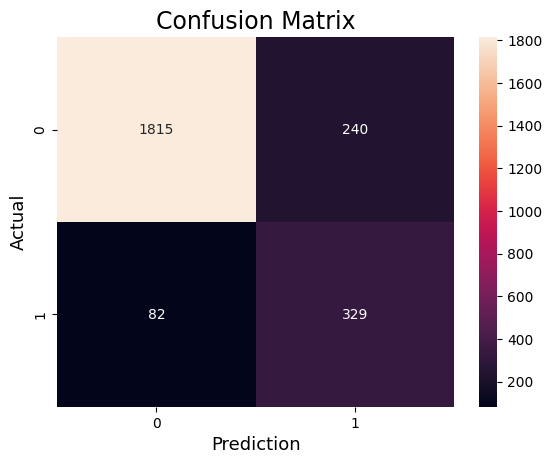

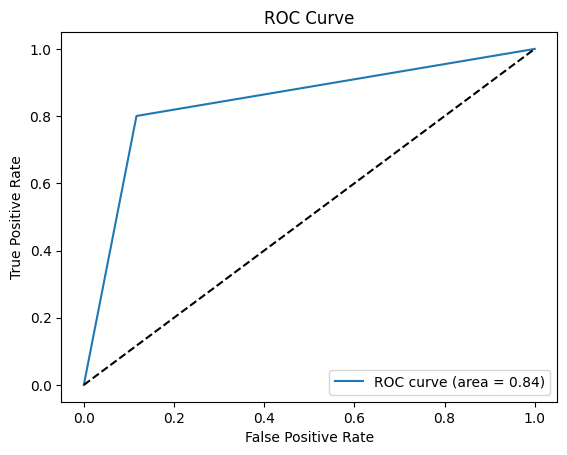

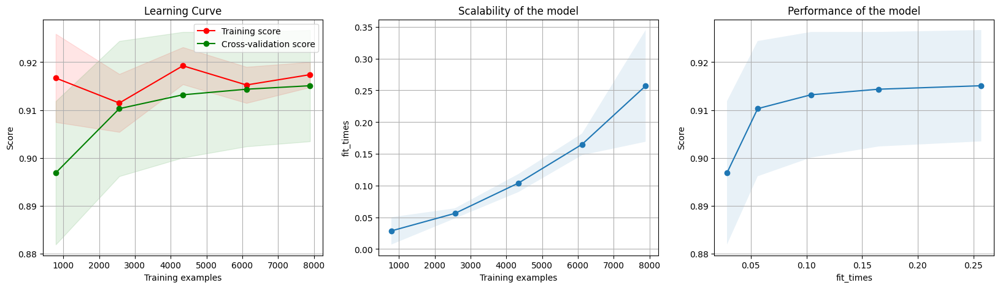

In [33]:
mlflow.set_experiment('test')
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
transformers = load_transformers('Pipelines')
transformers_names = sorted(
                [f for f in os.listdir('Pipelines') if os.path.isfile(os.path.join('Pipelines', f)) and f.endswith('.pkl')],
                key=lambda x: int(x.split('_')[0])
            )
for trans in transformers:
    X_train = trans.transform(X_train)
    X_val = trans.transform(X_val)

signature=infer_signature
skf = StratifiedKFold(n_splits=5, shuffle=True)
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularización
    'solver': ['liblinear', 'saga']  # Algoritmo de optimización
}

clf = LogisticRegression(max_iter=1000)
gscv = GridSearchCV(
    clf,
    param_grid=param_grid,
    cv=skf,
    n_jobs=-1
)
gscv.fit(X_train, y_train)

best_estimator = gscv.best_estimator_

y_pred = best_estimator.predict_proba(X_val)[:, 1]

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
# get the best threshold
J = tpr - fpr
ix = argmax(J)
best_thresh_auc = thresholds[ix]

thresholds = np.arange(0, 1, 0.001)
f1_scores = [f1_score(y_val, (y_pred > thr).astype(int)) for thr in thresholds]
ix = argmax(f1_scores)
best_thresh_f1 = thresholds[ix]
print('Best Threshold=%f' % (best_thresh_f1))

best_thresh = (best_thresh_auc + best_thresh_f1) / 2

print('Best Threshold=%f' % (best_thresh))
y_pred_bin = (y_pred > best_thresh).astype(int)
print_metrics(y_val, y_pred_bin)
fig1 = plot_confusion_matrix(y_val, y_pred_bin)
fig2 = plot_roc_curve(y_val, y_pred_bin)
#fig3 = plot_feature_importances(best_estimator, X_val)
fig4 = plot_learning_curve(best_estimator, "Learning Curve", X_train, y_train, cv=skf, n_jobs=-1, scoring='roc_auc')

visualizaciones = {fig1: 'Visualizaciones/Confusion_matrix.png', fig2: 'Visualizaciones/ROC_curve.png',fig4: 'Visualizaciones/Learning_curve.png'}

metrics = {'Accuracy': accuracy_score(y_val, y_pred_bin), 'Precision': precision_score(y_val, y_pred_bin), 'Recall': recall_score(y_val, y_pred_bin), 'F1': f1_score(y_val, y_pred_bin), 'AUC': roc_auc_score(y_val, y_pred_bin), 'PRAUC': average_precision_score(y_val, y_pred_bin), 'Threshold': best_thresh}
# metrics_df=evaluate(metrics_df,best_estimator,y_val,y_pred_bin,best_thresh)
# metrics_df
with mlflow.start_run(run_name='LogisticRegression') as run:
    
    for i in range(len(transformers_names)):
        mlflow.log_artifact(f"Pipelines/{transformers_names[i]}", "Pipelines")
    mlflow.log_params(best_estimator.get_params())
    for key, value in visualizaciones.items():
        mlflow.log_figure(key, value)
    mlflow.log_metrics(metrics)
    mlflow.set_tag("Training Info", "LogisticRegression Model")
    signature = infer_signature(X_train, (best_estimator.predict_proba(X_train)[:, 1] > best_thresh).astype(int))
    mlflow.sklearn.log_model(best_estimator, "LogisticRegression Model", signature=signature)
    mlflow.end_run()


In [ ]:
pkl_files = [f for f in files if os.path.isfile(os.path.join(folder_path, f)) and f.endswith('.pkl')]

In [1]:
!mlflow ui --port 8080 --backend-store-uri sqlite:///mlruns.db

^C
